# Overview
## In the NFL, can statistics predict Super Bowl winners?
The PowerPoint presentation uses analysis from this Jupyter notebook, with summaries in the below cells along the way. The presented information results in an answer of "No".

In [1]:
# Dependencies and Setup
import pandas as pd
from matplotlib import pyplot as plt
from scipy.stats import linregress
import numpy as np
import random

In [2]:
# WEB SCRAPING - ended up we did NOT use this 

url = 'https://www.pro-football-reference.com/years/2022/index.htm#all_playoff_results/'

url = 'https://www.pro-football-reference.com/tools/share.fcgi?id=9IPvX'
scrape_playoffs = pd.read_html(url)[0]
scrape_playoffs.head()

,Week,Day,Date,Winner/tie,Unnamed: 4,Loser/tie,Unnamed: 6,PtsW,PtsL
0,WildCard,Sat,2023-01-14,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,30
1,WildCard,Sat,2023-01-14,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,23
2,WildCard,Sun,2023-01-15,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,31
3,WildCard,Sun,2023-01-15,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,17
4,WildCard,Sun,2023-01-15,New York Giants,@,Minnesota Vikings,boxscore,31,24


In [3]:
# WEB SCRAPING - ended up we did NOT use this 

url = 'https://www.pro-football-reference.com/years/2022/opp.htm'
scrape_defense = pd.read_html(url)[0]
scrape_defense.head()

Unnamed: 0_level_0   Unnamed: 1_level_0 Unnamed: 2_level_0  \
                  Rk                   Tm                  G   
0                1.0  San Francisco 49ers               17.0   
1                2.0        Buffalo Bills               16.0   
2                3.0     Baltimore Ravens               17.0   
3                4.0        New York Jets               17.0   
4                5.0   Cincinnati Bengals               16.0   

  Unnamed: 3_level_0 Unnamed: 4_level_0 Tot Yds & TO             \
                  PA                Yds          Ply  Y/P    TO   
0              277.0             5110.0       1026.0  5.0  30.0   
1              286.0             5106.0        997.0  5.1  27.0   
2              315.0             5513.0       1047.0  5.3  25.0   
3              316.0             5288.0       1093.0  4.8  16.0   
4              322.0             5371.0        996.0  5.4  24.0   

  Unnamed: 8_level_0 Unnamed: 9_level_0  ... Rushing                    \
                  FL               1stD  ...     Yds    TD  Y/A   1stD   
0               10.0              291.0  ...  1321.0  11.0  3.4   77.0   
1               10.0              313.0  ...  1673.0  10.0  4.3  103.0   
2               11.0              323.0  ...  1566.0  11.0  3.9   91.0   
3                4.0              310.0  ...  2068.0  14.0  4.2  117.0   
4               11.0              295.0  ...  1706.0  12.0  4.2  102.0   

  Penalties              Unnamed: 25_level_0 Unnamed: 26_level_0  \
        Pen    Yds 1stPy                 Sc%                 TO%   
0      96.0  832.0  26.0                25.7                15.3   
1      89.0  754.0  29.0                31.0                14.3   
2      79.0  650.0  26.0                35.8                13.9   
3      90.0  707.0  27.0                32.3                 8.3   
4     100.0  832.0  20.0                36.4                13.1   

  Unnamed: 27_level_0  
                  EXP  
0               56.26  
1                4.46  
2              -32.38  
3               25.96  
4              -20.02  

[5 rows x 28 columns]

<b>APIs and web scraping</b> were both tested and used initially, but eventually the extensive data required was only found to be available (and free of charge) through csv downloads.

In [4]:
# Input csv files to load
offense_file_to_load = "Resources/nfl_statistics_team_offense_by_season.csv"
defense_file_to_load = "Resources/nfl_statistics_team_defense_by_season.csv"
playoff_file_to_load = "Resources/nfl_playoff_results_by_season.csv"

# Read offense, oefense, and playoffs into DataFrames
offense_df = pd.read_csv(offense_file_to_load)
defense_df = pd.read_csv(defense_file_to_load)
playoff_df = pd.read_csv(playoff_file_to_load)

In [5]:
offense_df.head()

,Season,OffRank,Team,GamesPlayed,OffTotPoints,OffTotYards,OffTotPlaysRun,OffTotYardsPerPlay,OffTotTurnovers,OffTotFumbles,...,OffRushYards,OffRushTouchdowns,OffRushYardsPerAttempt,OffRush1stDowns,OffNumOfPenalties,OffPenaltyYards,Off1stDownsByPenalty,OffPctOfDrivesEndingInScore,OffPctOfDrivesEndingInTurnover,OffExpectedPointsContributed
0,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1970,18,4.7,105,87,838,31,46.4,10.1,261.80
1,2022,2,Philadelphia Eagles,17,477,6614,1124,5.9,19,10,...,2509,32,4.6,161,90,682,29,42.5,10.2,210.87
2,2022,3,Dallas Cowboys,17,467,6034,1114,5.4,23,5,...,2298,24,4.3,129,104,842,24,41.5,10.8,112.34
3,2022,4,Buffalo Bills,16,455,6361,1037,6.1,27,13,...,2232,15,5.2,128,92,709,27,45.0,15.2,157.46
4,2022,5,Detroit Lions,17,453,6460,1092,5.9,15,8,...,2179,23,4.5,114,90,773,34,43.2,8.0,162.04


In [6]:
defense_df.head()

,Season,DefRank,Team,GamesPlayed,DefTotPoints,DefTotYards,DefTotPlaysRun,DefTotYardsPerPlay,DefTotTakeaways,DefTotFumbles,...,DefRushYards,DefRushTouchdowns,DefRushYardsPerAttempt,DefRush1stDowns,DefNumOfPenalties,DefPenaltyYards,Def1stDownsByPenalty,DefPctOfDrivesEndingInScore,DefPctOfDrivesEndingInTurnover,DefExpectedPointsContributed
0,2022,1,San Francisco 49ers,17,277,5110,1026,5.0,30,10,...,1321,11,3.4,77,96,832,26,25.7,15.3,56.26
1,2022,2,Buffalo Bills,16,286,5106,997,5.1,27,10,...,1673,10,4.3,103,89,754,29,31.0,14.3,4.46
2,2022,3,Baltimore Ravens,17,315,5513,1047,5.3,25,11,...,1566,11,3.9,91,79,650,26,35.8,13.9,-32.38
3,2022,4,New York Jets,17,316,5288,1093,4.8,16,4,...,2068,14,4.2,117,90,707,27,32.3,8.3,25.96
4,2022,5,Cincinnati Bengals,16,322,5371,996,5.4,24,11,...,1706,12,4.2,102,100,832,20,36.4,13.1,-20.02


In [7]:
playoff_df.head()

,Season,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,PtsLoser
0,2022,1,WildCard,Sat,1/14/2023,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,30
1,2022,1,WildCard,Sat,1/14/2023,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,23
2,2022,1,WildCard,Sun,1/15/2023,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,31
3,2022,1,WildCard,Sun,1/15/2023,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,17
4,2022,1,WildCard,Sun,1/15/2023,New York Giants,@,Minnesota Vikings,boxscore,31,24


In [8]:
# Merge offense and defense into 1 df
reg_season_df = pd.merge(offense_df, defense_df, on=["Season", "Team"])
reg_season_df.head()

,Season,OffRank,Team,GamesPlayed_x,OffTotPoints,OffTotYards,OffTotPlaysRun,OffTotYardsPerPlay,OffTotTurnovers,OffTotFumbles,...,DefRushYards,DefRushTouchdowns,DefRushYardsPerAttempt,DefRush1stDowns,DefNumOfPenalties,DefPenaltyYards,Def1stDownsByPenalty,DefPctOfDrivesEndingInScore,DefPctOfDrivesEndingInTurnover,DefExpectedPointsContributed
0,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1823,10,4.4,102,98,734,28,35.9,10.3,-49.50
1,2022,2,Philadelphia Eagles,17,477,6614,1124,5.9,19,10,...,2068,15,4.6,115,95,798,24,32.4,15.1,39.93
2,2022,3,Dallas Cowboys,17,467,6034,1114,5.4,23,5,...,2198,9,4.4,119,98,851,34,33.5,16.2,31.77
3,2022,4,Buffalo Bills,16,455,6361,1037,6.1,27,13,...,1673,10,4.3,103,89,754,29,31.0,14.3,4.46
4,2022,5,Detroit Lions,17,453,6460,1092,5.9,15,8,...,2491,22,5.2,135,103,818,33,41.2,11.9,-159.66


In [9]:
# Check to see if all rows merged
print(f"Offense count: {len(offense_df)}")
print(f"Defense count: {len(defense_df)}")
print(f"Both together: {len(reg_season_df)}")

Offense count: 640
Defense count: 640
Both together: 640


In [10]:
# view new df cols
reg_season_df.columns

Index(['Season', 'OffRank', 'Team', 'GamesPlayed_x', 'OffTotPoints',
       'OffTotYards', 'OffTotPlaysRun', 'OffTotYardsPerPlay',
       'OffTotTurnovers', 'OffTotFumbles', 'OffTot1stDowns',
       'OffPassCompletions', 'OffPassAttempts', 'OffPassYards',
       'OffPassTouchdowns', 'OffPassInterceptions',
       'OffPassNetYardsPerAttempt', 'OffPass1stDowns', 'OffRushAttempts',
       'OffRushYards', 'OffRushTouchdowns', 'OffRushYardsPerAttempt',
       'OffRush1stDowns', 'OffNumOfPenalties', 'OffPenaltyYards',
       'Off1stDownsByPenalty', 'OffPctOfDrivesEndingInScore',
       'OffPctOfDrivesEndingInTurnover', 'OffExpectedPointsContributed',
       'DefRank', 'GamesPlayed_y', 'DefTotPoints', 'DefTotYards',
       'DefTotPlaysRun', 'DefTotYardsPerPlay', 'DefTotTakeaways',
       'DefTotFumbles', 'DefTot1stDowns', 'DefPassCompletions',
       'DefPassAttempts', 'DefPassYards', 'DefPassTouchdowns',
       'DefPassInterceptions', 'DefPassNetYardsPerAttempt', 'DefPass1stDowns',
       'D

In [11]:
# delete 2 cols we will re-create ourselves to ensure accuracy, delete 1 duplicate column
# del reg_season_df["OffRank"]
# del reg_season_df["DefRank"]
del reg_season_df["GamesPlayed_y"]

# reformat the other dup
reg_season_df.rename(columns={"GamesPlayed_x": "GamesPlayed"}, inplace=True)

In [12]:
# verify column name changes
reg_season_df.columns

Index(['Season', 'OffRank', 'Team', 'GamesPlayed', 'OffTotPoints',
       'OffTotYards', 'OffTotPlaysRun', 'OffTotYardsPerPlay',
       'OffTotTurnovers', 'OffTotFumbles', 'OffTot1stDowns',
       'OffPassCompletions', 'OffPassAttempts', 'OffPassYards',
       'OffPassTouchdowns', 'OffPassInterceptions',
       'OffPassNetYardsPerAttempt', 'OffPass1stDowns', 'OffRushAttempts',
       'OffRushYards', 'OffRushTouchdowns', 'OffRushYardsPerAttempt',
       'OffRush1stDowns', 'OffNumOfPenalties', 'OffPenaltyYards',
       'Off1stDownsByPenalty', 'OffPctOfDrivesEndingInScore',
       'OffPctOfDrivesEndingInTurnover', 'OffExpectedPointsContributed',
       'DefRank', 'DefTotPoints', 'DefTotYards', 'DefTotPlaysRun',
       'DefTotYardsPerPlay', 'DefTotTakeaways', 'DefTotFumbles',
       'DefTot1stDowns', 'DefPassCompletions', 'DefPassAttempts',
       'DefPassYards', 'DefPassTouchdowns', 'DefPassInterceptions',
       'DefPassNetYardsPerAttempt', 'DefPass1stDowns', 'DefRushAttempts',
       'D

In [13]:
# for both offense and defense, group by each seasson and create new rank columns for total yards
reg_season_df["OffTotPointsRank"] = reg_season_df.groupby("Season")["OffTotPoints"].rank(ascending=False).astype(int)
reg_season_df["OffTotYardsRank"] = reg_season_df.groupby("Season")["OffTotYards"].rank(ascending=False).astype(int)
reg_season_df["OffTotPlaysRunRank"] = reg_season_df.groupby("Season")["OffTotPlaysRun"].rank(ascending=False).astype(int)
reg_season_df["OffTotYardsPerPlayRank"] = reg_season_df.groupby("Season")["OffTotYardsPerPlay"].rank(ascending=False).astype(int)
reg_season_df["OffTotTurnoversRank"] = reg_season_df.groupby("Season")["OffTotTurnovers"].rank(ascending=True).astype(int)
reg_season_df["OffTotFumblesRank"] = reg_season_df.groupby("Season")["OffTotFumbles"].rank(ascending=True).astype(int)
reg_season_df["OffTot1stDownsRank"] = reg_season_df.groupby("Season")["OffTot1stDowns"].rank(ascending=False).astype(int)
reg_season_df["OffPassCompletionsRank"] = reg_season_df.groupby("Season")["OffPassCompletions"].rank(ascending=False).astype(int)
reg_season_df["OffPassAttemptsRank"] = reg_season_df.groupby("Season")["OffPassAttempts"].rank(ascending=False).astype(int)
reg_season_df["OffPassYardsRank"] = reg_season_df.groupby("Season")["OffPassYards"].rank(ascending=False).astype(int)
reg_season_df["OffPassTouchdownsRank"] = reg_season_df.groupby("Season")["OffPassTouchdowns"].rank(ascending=False).astype(int)
reg_season_df["OffPassInterceptionsRank"] = reg_season_df.groupby("Season")["OffPassInterceptions"].rank(ascending=True).astype(int)
reg_season_df["OffPassNetYardsPerAttemptRank"] = reg_season_df.groupby("Season")["OffPassNetYardsPerAttempt"].rank(ascending=False).astype(int)
reg_season_df["OffPass1stDownsRank"] = reg_season_df.groupby("Season")["OffPass1stDowns"].rank(ascending=False).astype(int)
reg_season_df["OffRushAttemptsRank"] = reg_season_df.groupby("Season")["OffRushAttempts"].rank(ascending=False).astype(int)
reg_season_df["OffRushYardsRank"] = reg_season_df.groupby("Season")["OffRushYards"].rank(ascending=False).astype(int)
reg_season_df["OffRushTouchdownsRank"] = reg_season_df.groupby("Season")["OffRushTouchdowns"].rank(ascending=False).astype(int)
reg_season_df["OffRushYardsPerAttemptRank"] = reg_season_df.groupby("Season")["OffRushYardsPerAttempt"].rank(ascending=False).astype(int)
reg_season_df["OffRush1stDownsRank"] = reg_season_df.groupby("Season")["OffRush1stDowns"].rank(ascending=False).astype(int)
reg_season_df["OffNumOfPenaltiesRank"] = reg_season_df.groupby("Season")["OffNumOfPenalties"].rank(ascending=True).astype(int)
reg_season_df["OffPenaltyYardsRank"] = reg_season_df.groupby("Season")["OffPenaltyYards"].rank(ascending=True).astype(int)
reg_season_df["Off1stDownsByPenaltyRank"] = reg_season_df.groupby("Season")["Off1stDownsByPenalty"].rank(ascending=False).astype(int)
reg_season_df["OffPctOfDrivesEndingInScoreRank"] = reg_season_df.groupby("Season")["OffPctOfDrivesEndingInScore"].rank(ascending=False).astype(int)
reg_season_df["OffPctOfDrivesEndingInTurnoverRank"] = reg_season_df.groupby("Season")["OffPctOfDrivesEndingInTurnover"].rank(ascending=True).astype(int)
reg_season_df["OffExpectedPointsContributedRank"] = reg_season_df.groupby("Season")["OffExpectedPointsContributed"].rank(ascending=False).astype(int)
reg_season_df["DefTotPointsRank"] = reg_season_df.groupby("Season")["DefTotPoints"].rank(ascending=True).astype(int)
reg_season_df["DefTotYardsRank"] = reg_season_df.groupby("Season")["DefTotYards"].rank(ascending=True).astype(int)
reg_season_df["DefTotPlaysRunRank"] = reg_season_df.groupby("Season")["DefTotPlaysRun"].rank(ascending=True).astype(int)
reg_season_df["DefTotYardsPerPlayRank"] = reg_season_df.groupby("Season")["DefTotYardsPerPlay"].rank(ascending=True).astype(int)
reg_season_df["DefTotTakeawaysRank"] = reg_season_df.groupby("Season")["DefTotTakeaways"].rank(ascending=False).astype(int)
reg_season_df["DefTotFumblesRank"] = reg_season_df.groupby("Season")["DefTotFumbles"].rank(ascending=False).astype(int)
reg_season_df["DefTot1stDownsRank"] = reg_season_df.groupby("Season")["DefTot1stDowns"].rank(ascending=True).astype(int)
reg_season_df["DefPassCompletionsRank"] = reg_season_df.groupby("Season")["DefPassCompletions"].rank(ascending=True).astype(int)
reg_season_df["DefPassAttemptsRank"] = reg_season_df.groupby("Season")["DefPassAttempts"].rank(ascending=True).astype(int)
reg_season_df["DefPassYardsRank"] = reg_season_df.groupby("Season")["DefPassYards"].rank(ascending=True).astype(int)
reg_season_df["DefPassTouchdownsRank"] = reg_season_df.groupby("Season")["DefPassTouchdowns"].rank(ascending=True).astype(int)
reg_season_df["DefPassInterceptionsRank"] = reg_season_df.groupby("Season")["DefPassInterceptions"].rank(ascending=False).astype(int)
reg_season_df["DefPassNetYardsPerAttemptRank"] = reg_season_df.groupby("Season")["DefPassNetYardsPerAttempt"].rank(ascending=True).astype(int)
reg_season_df["DefPass1stDownsRank"] = reg_season_df.groupby("Season")["DefPass1stDowns"].rank(ascending=True).astype(int)
reg_season_df["DefRushAttemptsRank"] = reg_season_df.groupby("Season")["DefRushAttempts"].rank(ascending=True).astype(int)
reg_season_df["DefRushYardsRank"] = reg_season_df.groupby("Season")["DefRushYards"].rank(ascending=True).astype(int)
reg_season_df["DefRushTouchdownsRank"] = reg_season_df.groupby("Season")["DefRushTouchdowns"].rank(ascending=True).astype(int)
reg_season_df["DefRushYardsPerAttemptRank"] = reg_season_df.groupby("Season")["DefRushYardsPerAttempt"].rank(ascending=True).astype(int)
reg_season_df["DefRush1stDownsRank"] = reg_season_df.groupby("Season")["DefRush1stDowns"].rank(ascending=True).astype(int)
reg_season_df["DefNumOfPenaltiesRank"] = reg_season_df.groupby("Season")["DefNumOfPenalties"].rank(ascending=True).astype(int)
reg_season_df["DefPenaltyYardsRank"] = reg_season_df.groupby("Season")["DefPenaltyYards"].rank(ascending=True).astype(int)
reg_season_df["Def1stDownsByPenaltyRank"] = reg_season_df.groupby("Season")["Def1stDownsByPenalty"].rank(ascending=True).astype(int)
reg_season_df["DefPctOfDrivesEndingInScoreRank"] = reg_season_df.groupby("Season")["DefPctOfDrivesEndingInScore"].rank(ascending=True).astype(int)
reg_season_df["DefPctOfDrivesEndingInTurnoverRank"] = reg_season_df.groupby("Season")["DefPctOfDrivesEndingInTurnover"].rank(ascending=False).astype(int)
reg_season_df["DefExpectedPointsContributedRank"] = reg_season_df.groupby("Season")["DefExpectedPointsContributed"].rank(ascending=False).astype(int)

In [14]:
# create new df for total yards rankings by season
reg_season_rankings_df = reg_season_df[["Season", \
                              "Team", \
                              "OffTotPointsRank", \
                              "DefTotPointsRank", \
                              "OffTotYardsRank", \
                              "DefTotYardsRank", \
                              "OffTotPlaysRunRank", \
                              "DefTotPlaysRunRank", \
                              "OffTotYardsPerPlayRank", \
                              "DefTotYardsPerPlayRank", \
                              "OffTotTurnoversRank", \
                              "DefTotTakeawaysRank", \
                              "OffTotFumblesRank", \
                              "DefTotFumblesRank", \
                              "OffTot1stDownsRank", \
                              "DefTot1stDownsRank", \
                              "OffPassCompletionsRank", \
                              "DefPassCompletionsRank", \
                              "OffPassAttemptsRank", \
                              "DefPassAttemptsRank", \
                              "OffPassYardsRank", \
                              "DefPassYardsRank", \
                              "OffPassTouchdownsRank", \
                              "DefPassTouchdownsRank", \
                              "OffPassInterceptionsRank", \
                              "DefPassInterceptionsRank", \
                              "OffPassNetYardsPerAttemptRank", \
                              "DefPassNetYardsPerAttemptRank", \
                              "OffPass1stDownsRank", \
                              "DefPass1stDownsRank", \
                              "OffRushAttemptsRank", \
                              "DefRushAttemptsRank", \
                              "OffRushYardsRank", \
                              "DefRushYardsRank", \
                              "OffRushTouchdownsRank", \
                              "DefRushTouchdownsRank", \
                              "OffRushYardsPerAttemptRank", \
                              "DefRushYardsPerAttemptRank", \
                              "OffRush1stDownsRank", \
                              "DefRush1stDownsRank", \
                              "OffNumOfPenaltiesRank", \
                              "DefNumOfPenaltiesRank", \
                              "OffPenaltyYardsRank", \
                              "DefPenaltyYardsRank", \
                              "Off1stDownsByPenaltyRank", \
                              "Def1stDownsByPenaltyRank", \
                              "OffPctOfDrivesEndingInScoreRank", \
                              "DefPctOfDrivesEndingInScoreRank", \
                              "OffPctOfDrivesEndingInTurnoverRank", \
                              "DefPctOfDrivesEndingInTurnoverRank", \
                              "OffExpectedPointsContributedRank", \
                              "DefExpectedPointsContributedRank" \
                             ]].copy()
# sort the df
reg_season_rankings_df = reg_season_rankings_df.sort_values(by=["Season", "Team"], ascending=True)
reg_season_rankings_df.head()

,Season,Team,OffTotPointsRank,DefTotPointsRank,OffTotYardsRank,DefTotYardsRank,OffTotPlaysRunRank,DefTotPlaysRunRank,OffTotYardsPerPlayRank,DefTotYardsPerPlayRank,...,OffPenaltyYardsRank,DefPenaltyYardsRank,Off1stDownsByPenaltyRank,Def1stDownsByPenaltyRank,OffPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInScoreRank,OffPctOfDrivesEndingInTurnoverRank,DefPctOfDrivesEndingInTurnoverRank,OffExpectedPointsContributedRank,DefExpectedPointsContributedRank
639,2003,Arizona Cardinals,32,32,27,26,23,12,28,27,...,6,6,7,7,30,30,31,21,31,32
627,2003,Atlanta Falcons,20,30,29,32,31,25,25,32,...,9,25,14,12,26,24,11,12,22,22
615,2003,Baltimore Ravens,8,6,21,3,16,21,18,1,...,24,20,21,18,13,3,26,7,28,1
638,2003,Buffalo Bills,30,5,30,2,24,18,31,2,...,18,24,24,16,31,8,30,32,30,7
622,2003,Carolina Panthers,15,10,16,8,17,14,16,6,...,23,28,18,27,15,6,21,20,16,4


In [15]:
# Merge to be used for some playoff analysis
reg_point_df = reg_season_df
merged_points_df = pd.merge(playoff_df, reg_point_df, left_on=["Season", "Winner"], right_on=["Season", "Team"], how="left")
merged_points_df.head()

,Season,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,...,DefRushYardsRank,DefRushTouchdownsRank,DefRushYardsPerAttemptRank,DefRush1stDownsRank,DefNumOfPenaltiesRank,DefPenaltyYardsRank,Def1stDownsByPenaltyRank,DefPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInTurnoverRank,DefExpectedPointsContributedRank
0,2022,1,WildCard,Sat,1/14/2023,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,...,12,15,8,15,11,3,9,17,4,18
1,2022,1,WildCard,Sat,1/14/2023,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,...,2,8,1,1,18,24,12,1,2,1
2,2022,1,WildCard,Sun,1/15/2023,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,...,4,6,12,10,9,12,20,3,5,8
3,2022,1,WildCard,Sun,1/15/2023,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,...,5,11,8,8,25,24,2,18,9,9
4,2022,1,WildCard,Sun,1/15/2023,New York Giants,@,Minnesota Vikings,boxscore,31,...,27,20,30,28,30,23,30,25,26,29


In [16]:
# Merge to isolate Super Bowl data
playoff_points_df = merged_points_df[merged_points_df['RoundName'].str.contains('SuperBowl')]
playoff_points_df.head()

,Season,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,...,DefRushYardsRank,DefRushTouchdownsRank,DefRushYardsPerAttemptRank,DefRush1stDownsRank,DefNumOfPenaltiesRank,DefPenaltyYardsRank,Def1stDownsByPenaltyRank,DefPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInTurnoverRank,DefExpectedPointsContributedRank
12,2022,4,SuperBowl,Sun,2/12/2022,Kansas City Chiefs,NaN,Philadelphia Eagles,boxscore,38,...,8,6,16,8,22,11,17,14,21,14
24,2021,4,SuperBowl,Sun,2/13/2022,Los Angeles Rams,N,Cincinnati Bengals,boxscore,23,...,6,24,6,16,4,2,5,13,9,8
37,2020,4,SuperBowl,Sun,2/7/2021,Tampa Bay Buccaneers,N,Kansas City Chiefs,boxscore,31,...,1,1,1,1,22,31,10,6,4,6
48,2019,4,SuperBowl,Sun,2/2/2020,Kansas City Chiefs,N,San Francisco 49ers,boxscore,31,...,26,18,28,28,25,10,27,11,9,17
59,2018,4,SuperBowl,Sun,2/3/2019,New England Patriots,N,Los Angeles Rams,boxscore,13,...,11,2,28,13,3,11,3,4,4,8


In [17]:
# Merge the Offense/Defense with Playoff data for offense vs defense analysis
merged_season_playoff_df = pd.merge(reg_season_df, playoff_df, on=["Season"])
merged_season_playoff_df.head()

,Season,OffRank,Team,GamesPlayed,OffTotPoints,OffTotYards,OffTotPlaysRun,OffTotYardsPerPlay,OffTotTurnovers,OffTotFumbles,...,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,PtsLoser
0,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1,WildCard,Sat,1/14/2023,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,30
1,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1,WildCard,Sat,1/14/2023,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,23
2,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1,WildCard,Sun,1/15/2023,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,31
3,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1,WildCard,Sun,1/15/2023,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,17
4,2022,1,Kansas City Chiefs,17,496,7032,1094,6.4,23,11,...,1,WildCard,Sun,1/15/2023,New York Giants,@,Minnesota Vikings,boxscore,31,24


In [18]:
#bring the merged data into a csv
merged_season_playoff_df.to_csv("Resources/merged_season_playoff_data.csv")

In [19]:
#Create new df that will only include the columns needed to do the offense vs defense analysis
sliced_merged_season_playoff_df = merged_season_playoff_df[['Season', 'OffRank', 'Team', 'DefRank', 'RoundName', 'Winner', 'Loser']]
sliced_merged_season_playoff_df

,Season,OffRank,Team,DefRank,RoundName,Winner,Loser
0,2022,1,Kansas City Chiefs,16,WildCard,Jacksonville Jaguars,Los Angeles Chargers
1,2022,1,Kansas City Chiefs,16,WildCard,San Francisco 49ers,Seattle Seahawks
2,2022,1,Kansas City Chiefs,16,WildCard,Buffalo Bills,Miami Dolphins
3,2022,1,Kansas City Chiefs,16,WildCard,Cincinnati Bengals,Baltimore Ravens
4,2022,1,Kansas City Chiefs,16,WildCard,New York Giants,Minnesota Vikings
...,...,...,...,...,...,...,...
7195,2003,32,Arizona Cardinals,32,Division,Philadelphia Eagles,Green Bay Packers
7196,2003,32,Arizona Cardinals,32,Division,Indianapolis Colts,Kansas City Chiefs
7197,2003,32,Arizona Cardinals,32,ConfChamp,New England Patriots,Indianapolis Colts
7198,2003,32,Arizona Cardinals,32,ConfChamp,Carolina Panthers,Philadelphia Eagles


In [20]:
# select a value to filter by
chosen_value = 'SuperBowl'

In [21]:
#Create a new filtered dataframe that filters 'Superbowl' Winners
filtered_df = sliced_merged_season_playoff_df.loc[sliced_merged_season_playoff_df['RoundName'] == chosen_value]

In [22]:
filtered_df.to_csv('Resources/3filtered.csv')

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

#Create another filtered dataframe that will only include rows with Winner and Team being same values.
new_3filtered = filtered_df[filtered_df['Winner'] == filtered_df['Team']]

new_3filtered.head()

,Season,OffRank,Team,DefRank,RoundName,Winner,Loser
12,2022,1,Kansas City Chiefs,16,SuperBowl,Kansas City Chiefs,Philadelphia Eagles
511,2021,8,Los Angeles Rams,15,SuperBowl,Los Angeles Rams,Cincinnati Bengals
838,2020,3,Tampa Bay Buccaneers,8,SuperBowl,Tampa Bay Buccaneers,Kansas City Chiefs
1270,2019,5,Kansas City Chiefs,7,SuperBowl,Kansas City Chiefs,San Francisco 49ers
1611,2018,4,New England Patriots,7,SuperBowl,New England Patriots,Los Angeles Rams


Co-efficient of Variation (CV): 11.6%


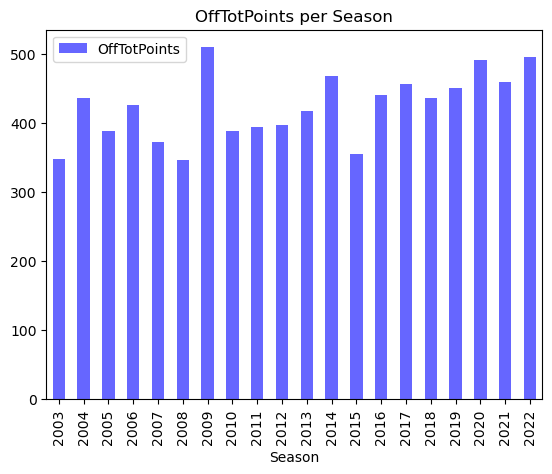

Co-efficient of Variation (CV): 8.8%


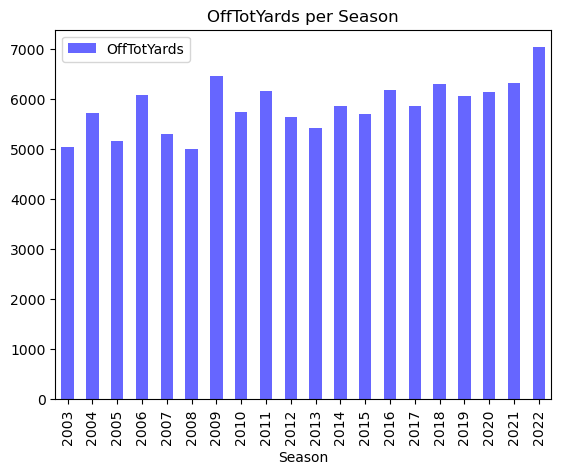

Co-efficient of Variation (CV): 3.5%


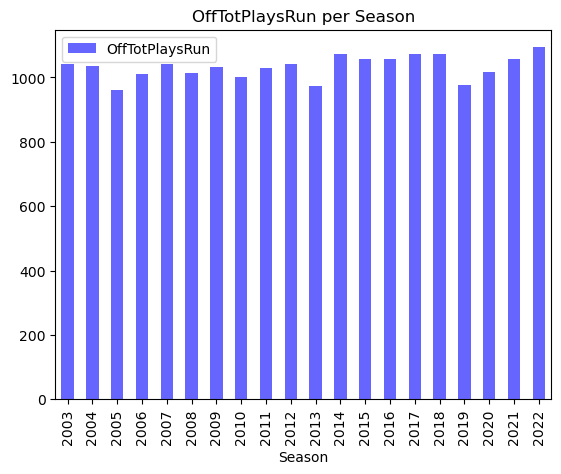

Co-efficient of Variation (CV): 7.8%


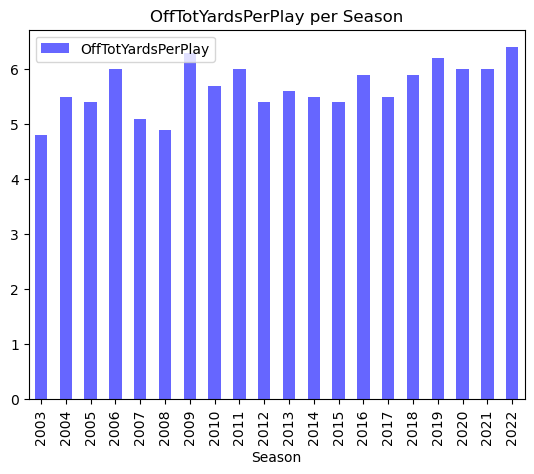

Co-efficient of Variation (CV): 27.1%


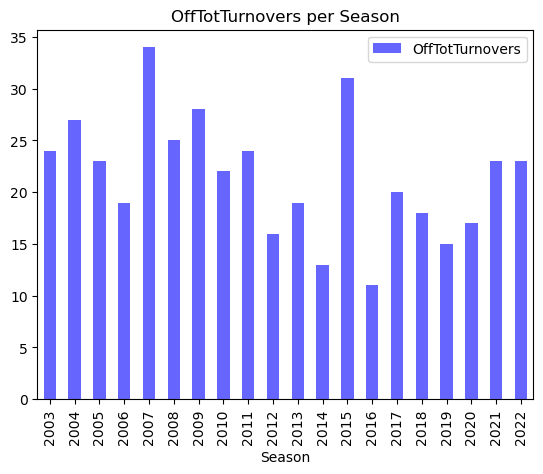

Co-efficient of Variation (CV): 33.6%


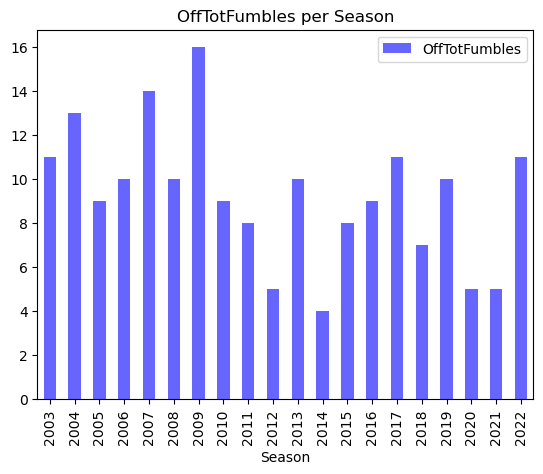

Co-efficient of Variation (CV): 9.1%


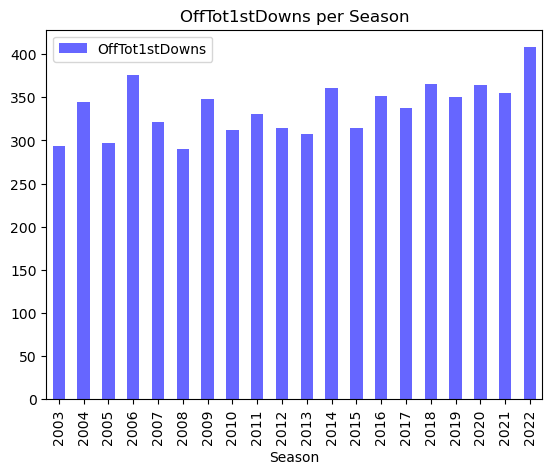

Co-efficient of Variation (CV): 14.7%


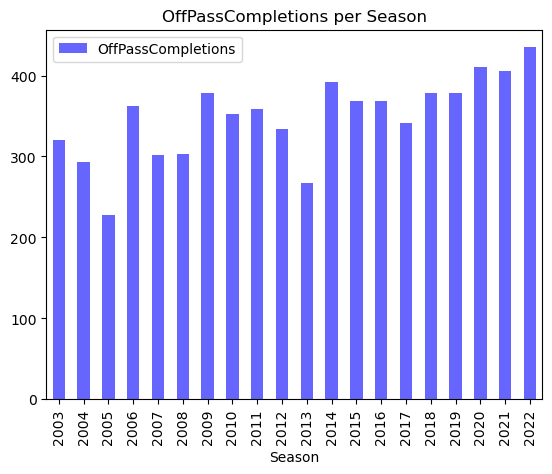

Co-efficient of Variation (CV): 11.9%


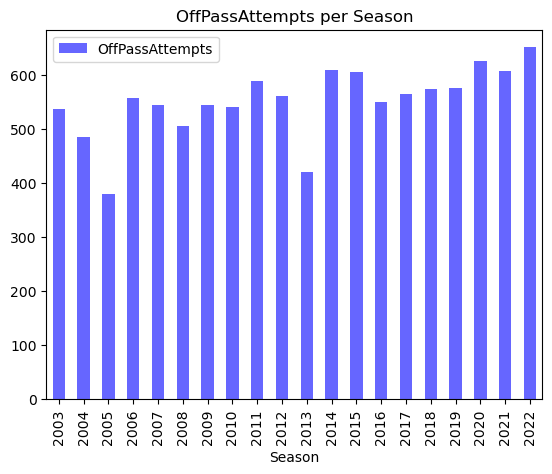

Co-efficient of Variation (CV): 14.8%


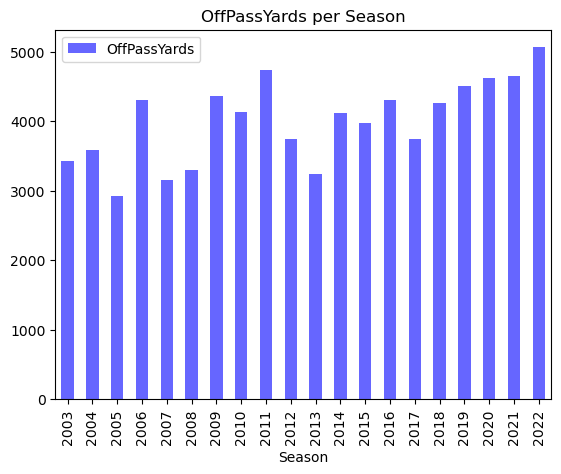

Co-efficient of Variation (CV): 24.2%


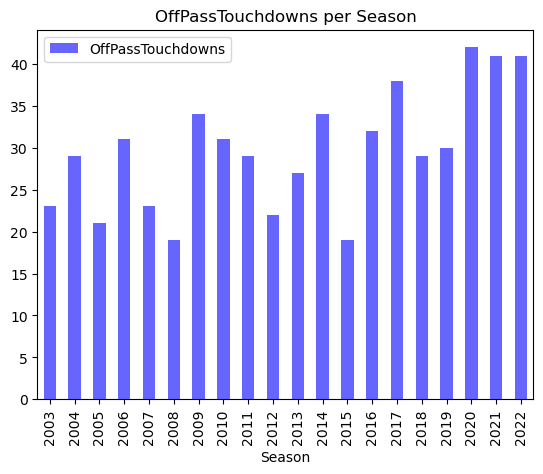

Co-efficient of Variation (CV): 39.0%


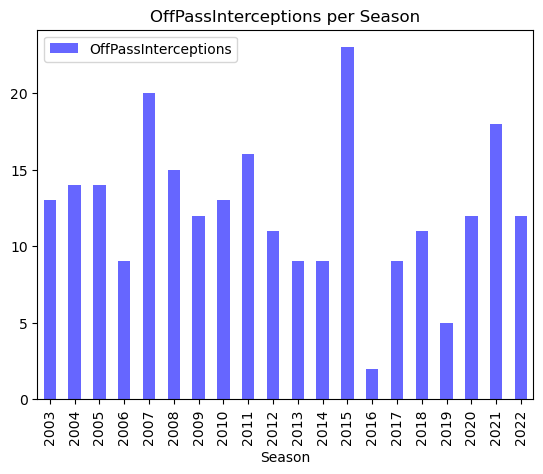

Co-efficient of Variation (CV): 9.6%


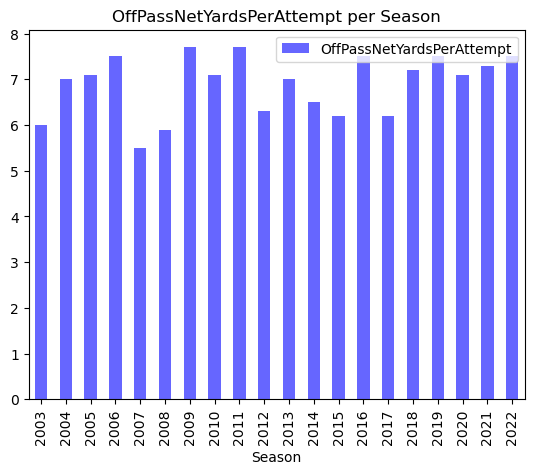

Co-efficient of Variation (CV): 15.1%


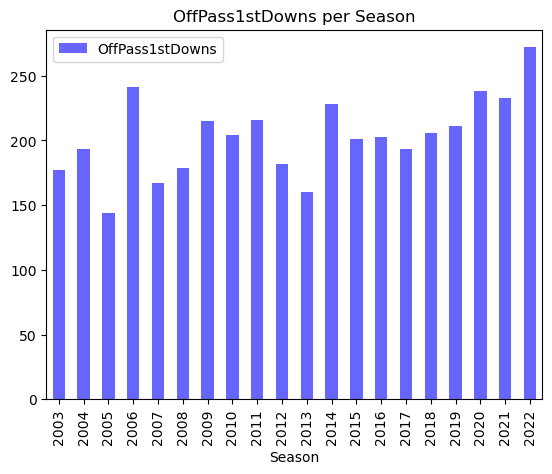

Co-efficient of Variation (CV): 10.3%


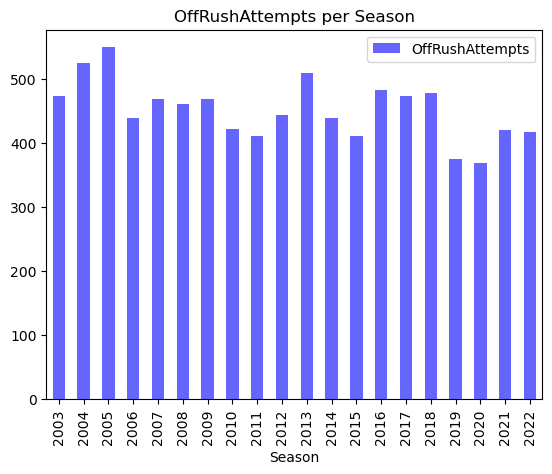

Co-efficient of Variation (CV): 13.5%


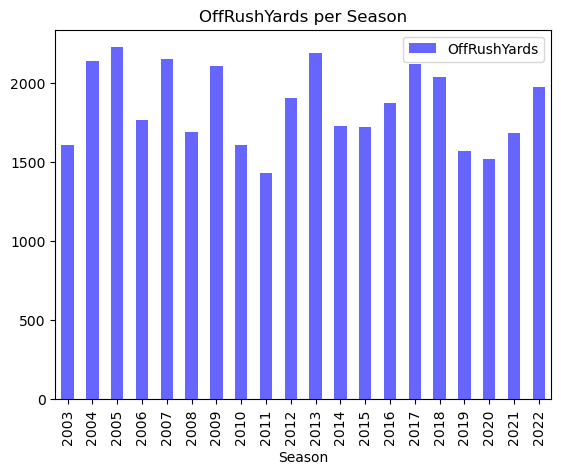

Co-efficient of Variation (CV): 23.4%


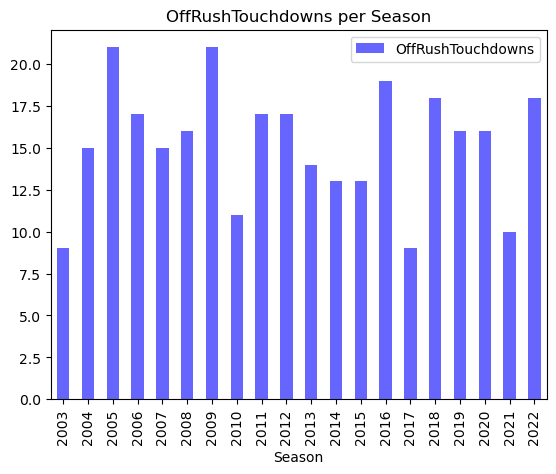

Co-efficient of Variation (CV): 8.4%


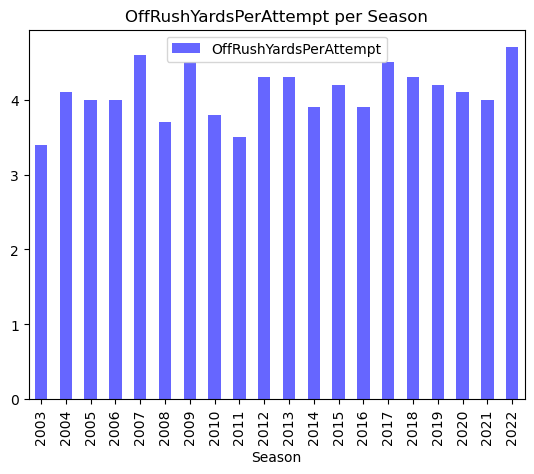

Co-efficient of Variation (CV): 13.8%


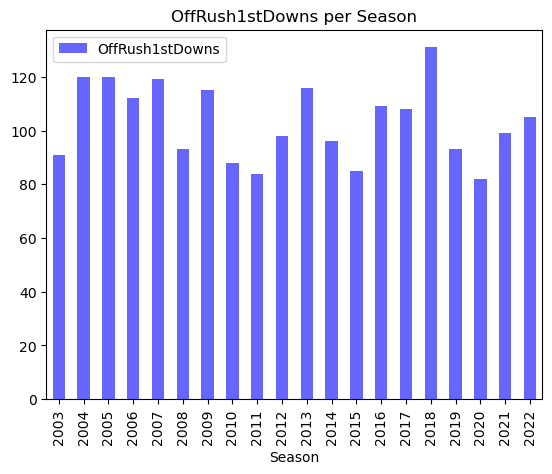

Co-efficient of Variation (CV): 16.0%


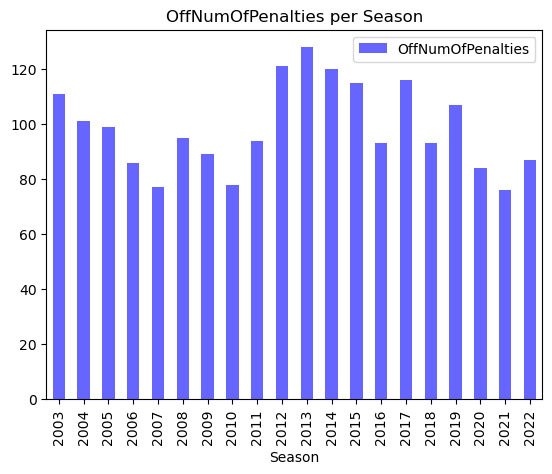

Co-efficient of Variation (CV): 19.6%


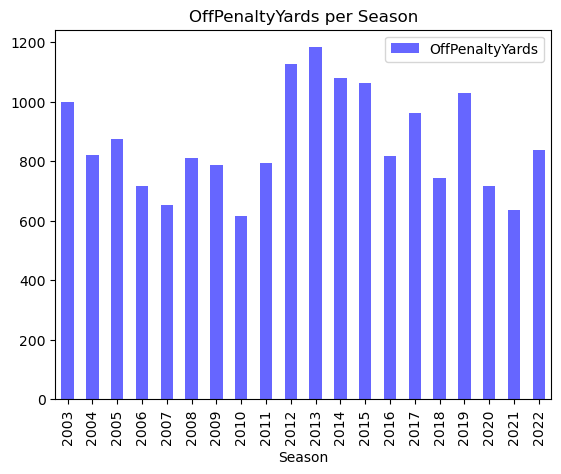

Co-efficient of Variation (CV): 25.8%


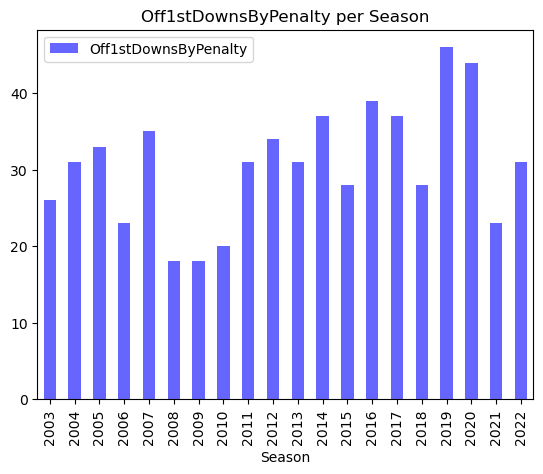

Co-efficient of Variation (CV): 16.0%


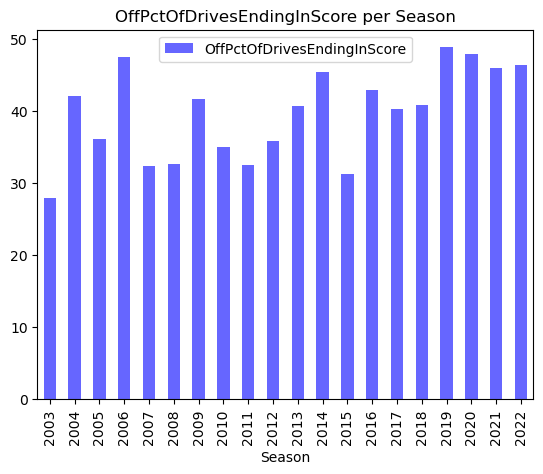

Co-efficient of Variation (CV): 27.5%


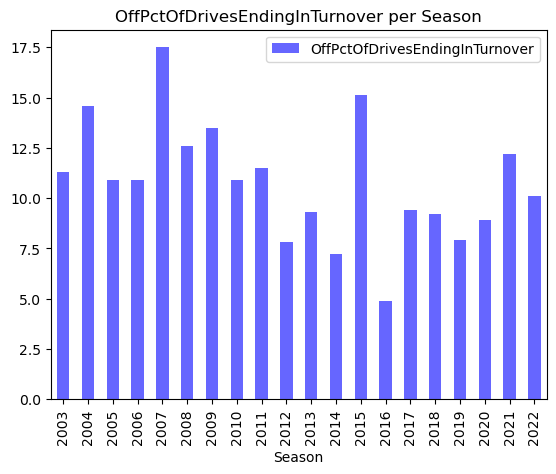

Co-efficient of Variation (CV): 299.7%


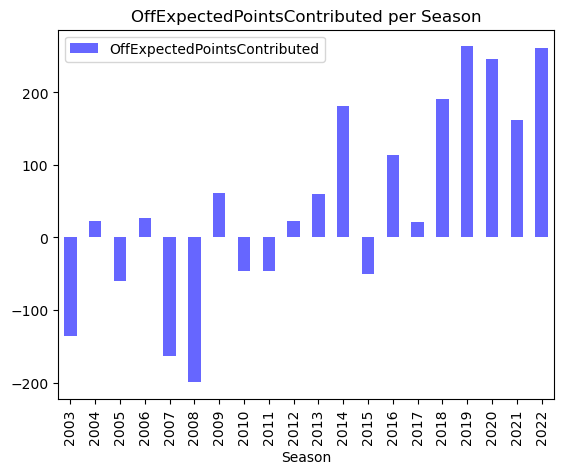

Co-efficient of Variation (CV): 17.9%


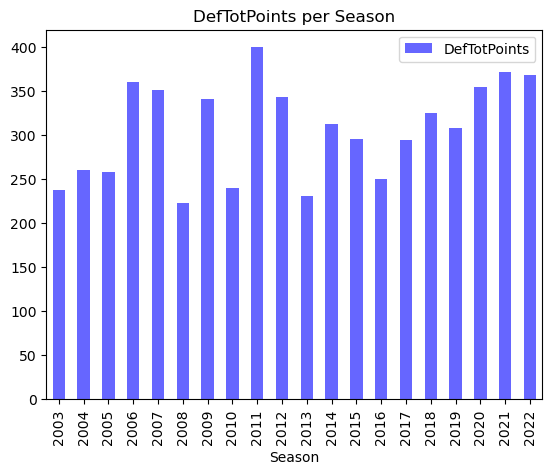

Co-efficient of Variation (CV): 11.2%


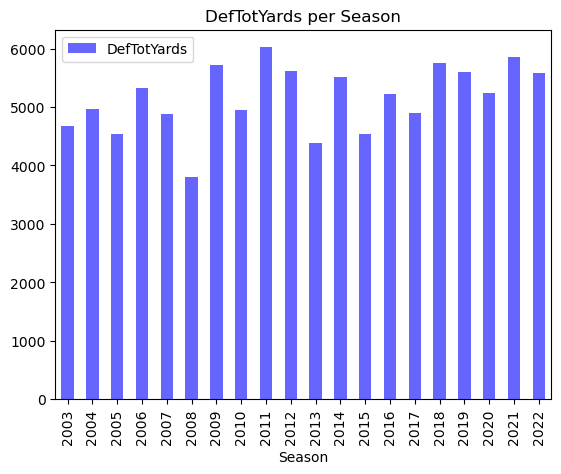

Co-efficient of Variation (CV): 4.5%


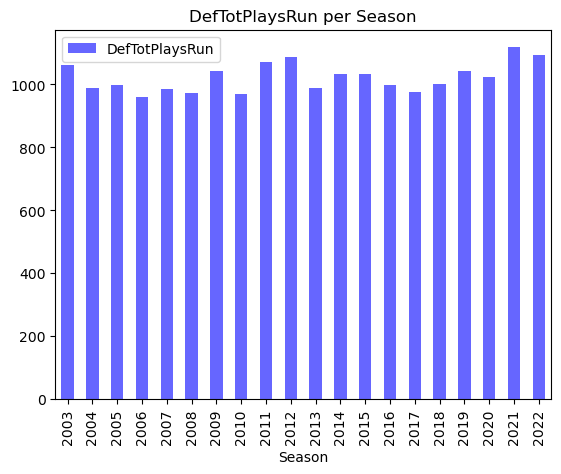

Co-efficient of Variation (CV): 9.3%


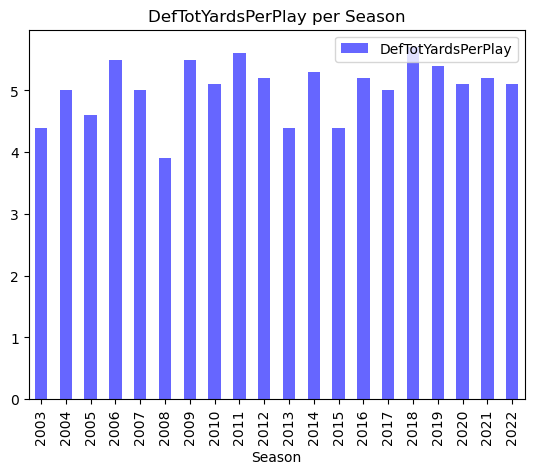

Co-efficient of Variation (CV): 20.3%


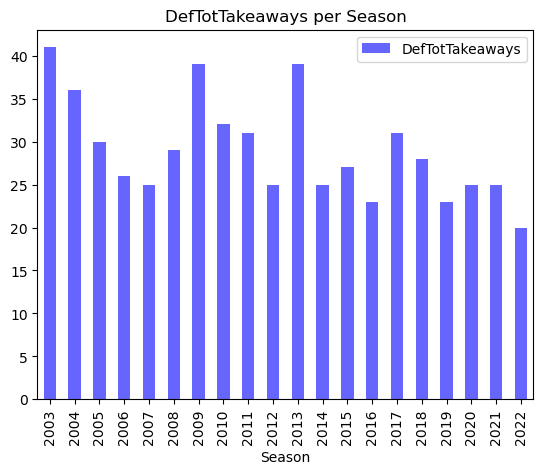

Co-efficient of Variation (CV): 23.1%


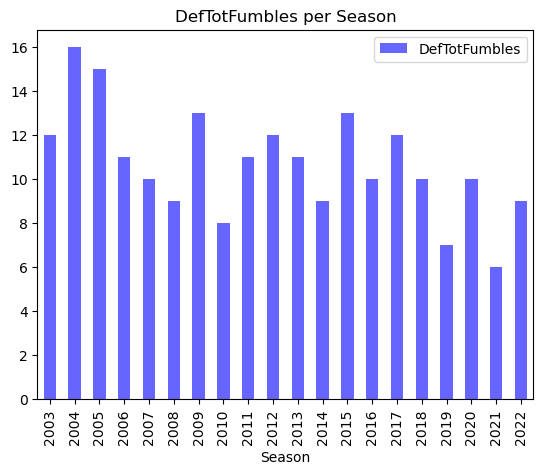

Co-efficient of Variation (CV): 9.6%


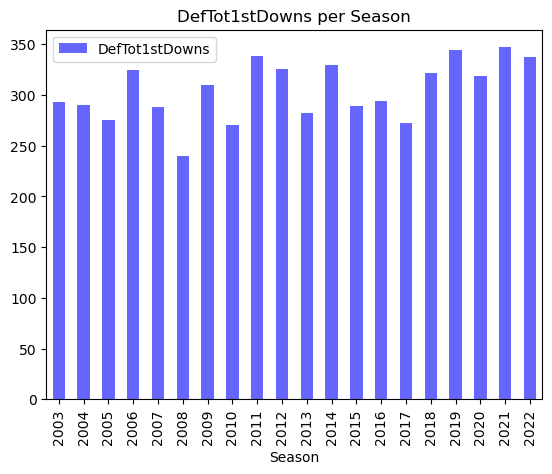

Co-efficient of Variation (CV): 12.2%


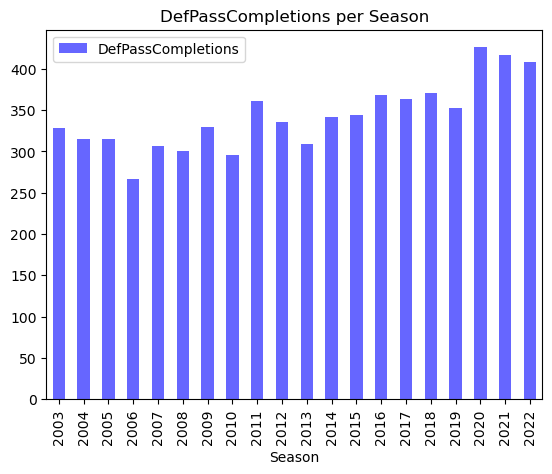

Co-efficient of Variation (CV): 8.7%


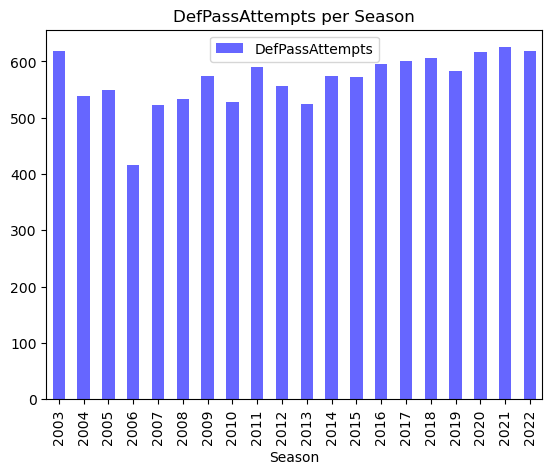

Co-efficient of Variation (CV): 13.9%


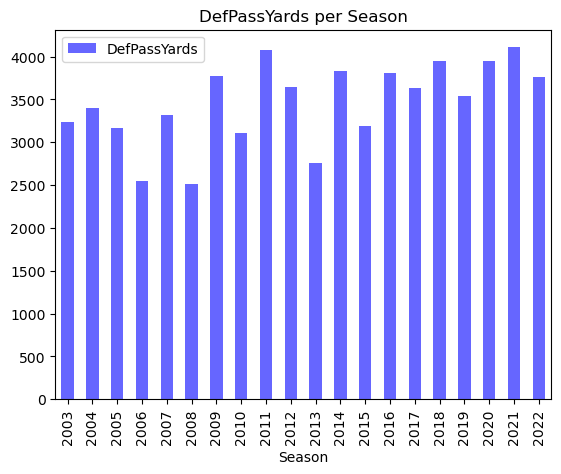

Co-efficient of Variation (CV): 30.7%


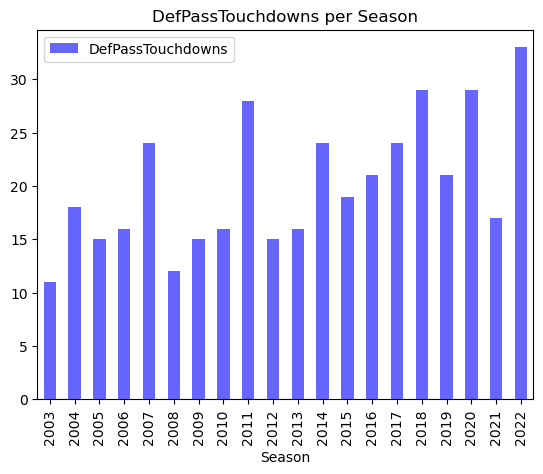

Co-efficient of Variation (CV): 27.8%


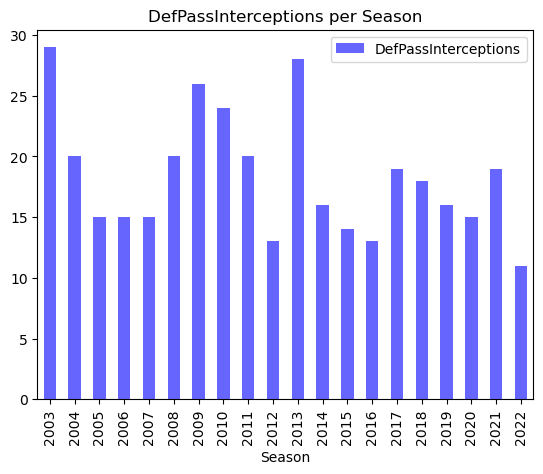

Co-efficient of Variation (CV): 9.7%


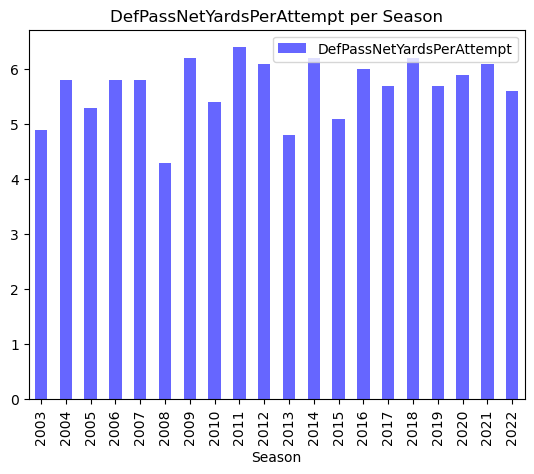

Co-efficient of Variation (CV): 11.3%


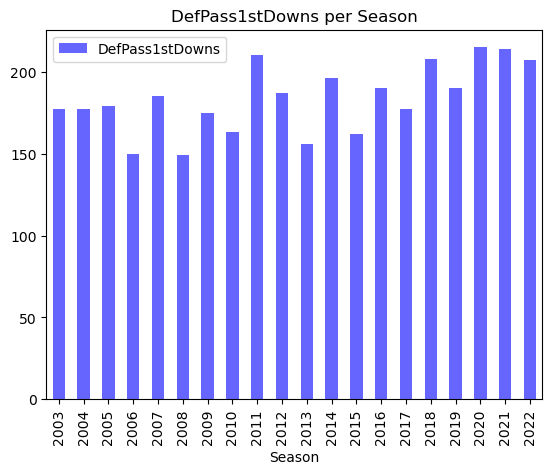

Co-efficient of Variation (CV): 10.2%


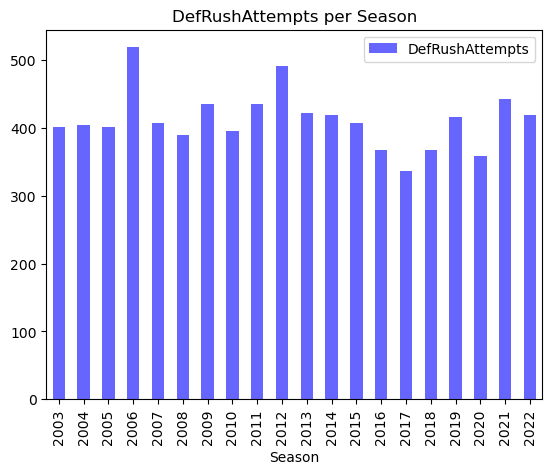

Co-efficient of Variation (CV): 21.3%


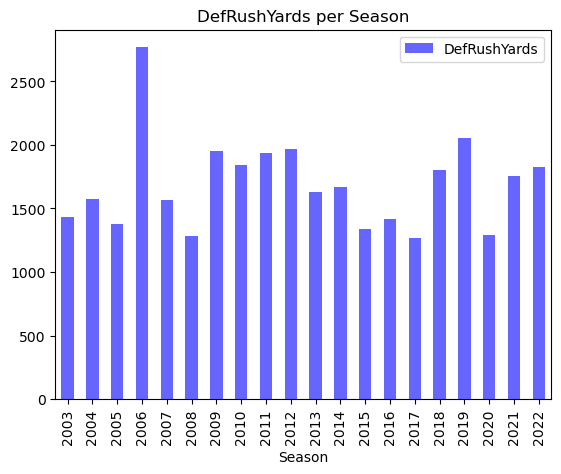

Co-efficient of Variation (CV): 43.5%


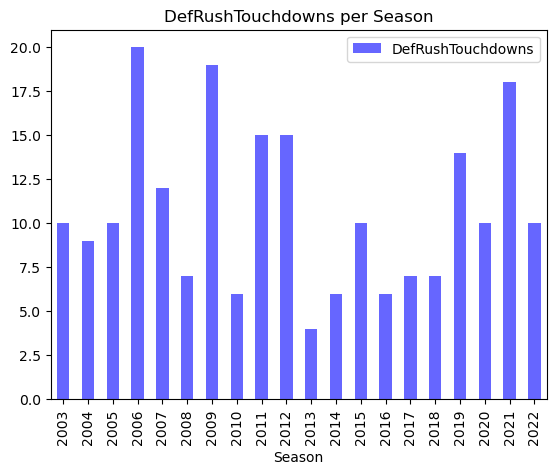

Co-efficient of Variation (CV): 13.9%


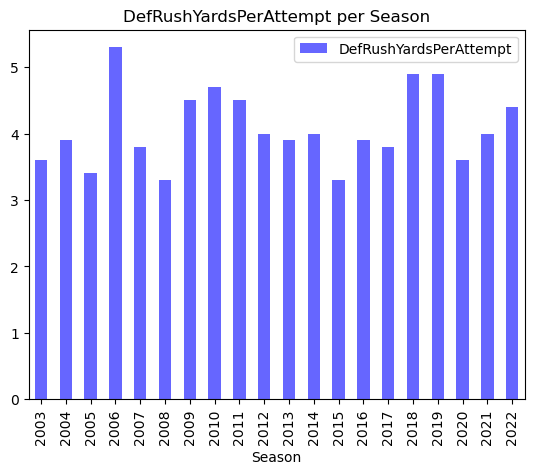

Co-efficient of Variation (CV): 21.3%


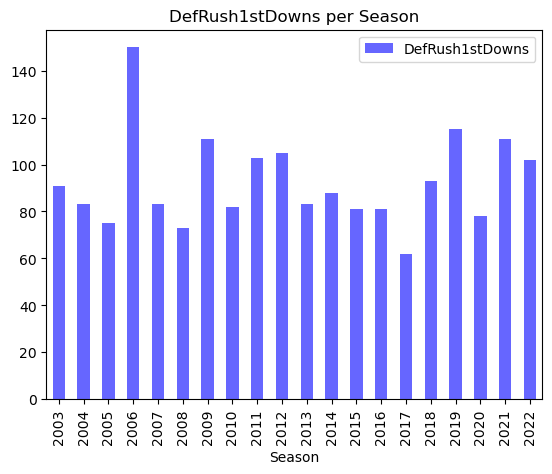

Co-efficient of Variation (CV): 11.1%


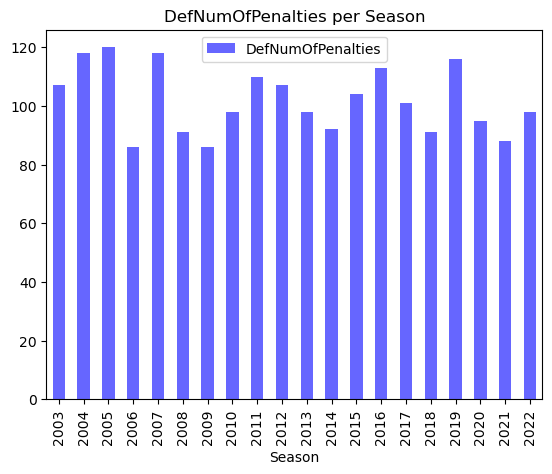

Co-efficient of Variation (CV): 13.0%


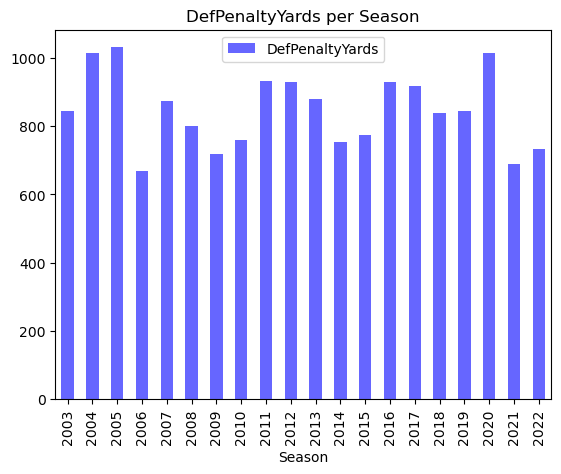

Co-efficient of Variation (CV): 29.9%


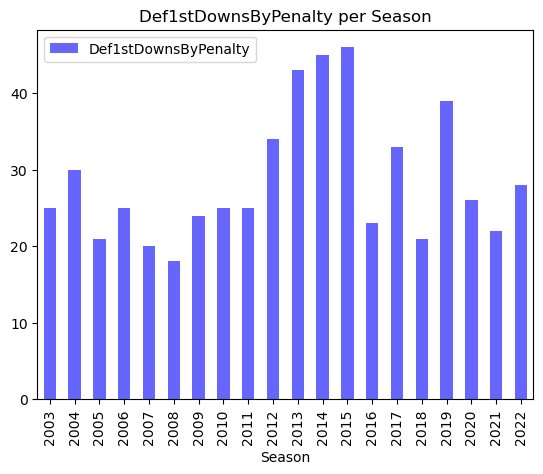

Co-efficient of Variation (CV): 16.3%


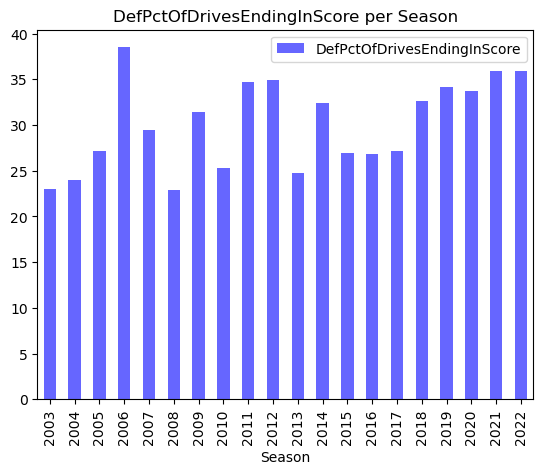

Co-efficient of Variation (CV): 19.0%


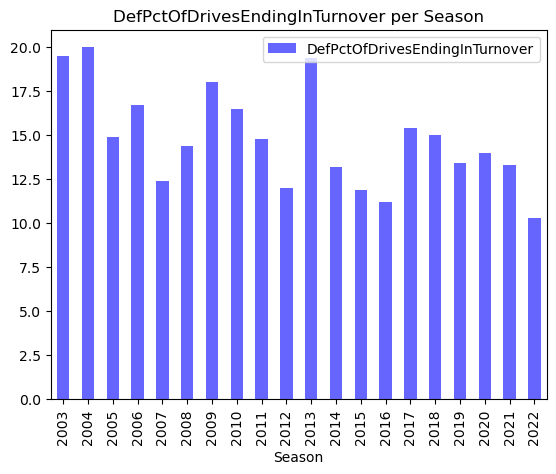

Co-efficient of Variation (CV): 107.5%


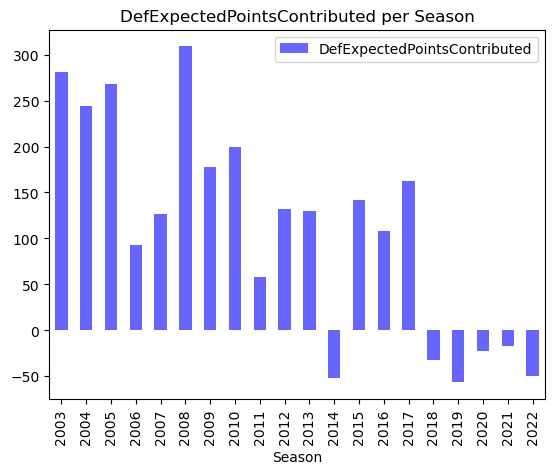

In [24]:
# COMPARING STATS FOR SUPER BOWL WINNERS BY YEAR
# Loop through the columns
for col in playoff_points_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore unrelated cols)
    # Ignore 'Rank' cols this time, want the actual total values
    if (col.startswith("Off") | col.startswith("Def")) & ~col.endswith("Rank"):
        # Bar plot every super bowl winner by year
        playoff_points_df.plot.bar(
            x='Season', 
            y=col, 
            color='blue', 
            alpha=.6, 
            title=f"{col} per Season", 
            legend=True)
        plt.gca().invert_xaxis()
        print(f"Co-efficient of Variation (CV): \
{round(100*(playoff_points_df[col].std()/playoff_points_df[col].mean()),1)}%")
        
        plt.savefig(f"output_data/season_average_w_CV_{col}.png")
        # Show plot
        plt.show()

## Bar Plot Summary for the above charts is located 3 cells below here

In [25]:
# Show the CV values
for col in playoff_points_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Ignore 'Rank' cols this time, want the actual total values for these plots
    if (col.startswith("Off") | col.startswith("Def")) & ~col.endswith("Rank"):
        print(f"Co-efficient of Variation (CV): {round(100*(playoff_points_df[col].std()/playoff_points_df[col].mean()),1)}...{col} ")

Co-efficient of Variation (CV): 11.6...OffTotPoints 
Co-efficient of Variation (CV): 8.8...OffTotYards 
Co-efficient of Variation (CV): 3.5...OffTotPlaysRun 
Co-efficient of Variation (CV): 7.8...OffTotYardsPerPlay 
Co-efficient of Variation (CV): 27.1...OffTotTurnovers 
Co-efficient of Variation (CV): 33.6...OffTotFumbles 
Co-efficient of Variation (CV): 9.1...OffTot1stDowns 
Co-efficient of Variation (CV): 14.7...OffPassCompletions 
Co-efficient of Variation (CV): 11.9...OffPassAttempts 
Co-efficient of Variation (CV): 14.8...OffPassYards 
Co-efficient of Variation (CV): 24.2...OffPassTouchdowns 
Co-efficient of Variation (CV): 39.0...OffPassInterceptions 
Co-efficient of Variation (CV): 9.6...OffPassNetYardsPerAttempt 
Co-efficient of Variation (CV): 15.1...OffPass1stDowns 
Co-efficient of Variation (CV): 10.3...OffRushAttempts 
Co-efficient of Variation (CV): 13.5...OffRushYards 
Co-efficient of Variation (CV): 23.4...OffRushTouchdowns 
Co-efficient of Variation (CV): 8.4...OffRush

In [26]:
# Show the percent difference between the low CV category vs the entire league
print(f"Offensive Total Plays Run - Super Bowl Winner: {round(playoff_points_df['OffTotPlaysRun'].mean(),1)}")
print(f"Offensive Total Plays Run - All Teams: {round(offense_df['OffTotPlaysRun'].mean(),1)}")
print(f"Offensive Percentage Difference: \
{round(((playoff_points_df['OffTotPlaysRun'].mean())-(offense_df['OffTotPlaysRun'].mean()))/(offense_df['OffTotPlaysRun'].mean()) * 100,1)}%")
print("")
print(f"Defensive Total Plays Run - Super Bowl Winner: {round(playoff_points_df['DefTotPlaysRun'].mean(),1)}")
print(f"Defensive Total Plays Run - All Teams: {round(defense_df['DefTotPlaysRun'].mean(),1)}")
print(f"Defensive Percentage Difference: \
{round(((playoff_points_df['DefTotPlaysRun'].mean())-(defense_df['DefTotPlaysRun'].mean()))/(defense_df['DefTotPlaysRun'].mean()) * 100,1)}%")

Offensive Total Plays Run - Super Bowl Winner: 1032.8
Offensive Total Plays Run - All Teams: 1019.4
Offensive Percentage Difference: 1.3%

Defensive Total Plays Run - Super Bowl Winner: 1022.1
Defensive Total Plays Run - All Teams: 1019.4
Defensive Percentage Difference: 0.3%


# Bar Plot Summary:
## Super Bowl Winners Over a 20 Year Period

In the above charts, 50 statistical categories were evaluated in all.

Co-efficient of Variation (CV) is the Standard Deviation divided by the Mean. It measures how spread out the values are.

CV is a percentage, therefore it can be compared across different units of measurement (points scored, yards, etc.).

CV values ranged from 3.5% to 299.7%.

The two lowest CVs (i.e. the lowest disbursements) were “Offensive Total Plays Run” and 
“Defensive Total Plays Run”. However, these categories were only 1.3% and 0.3% higher than the league average, so they can be eliminated.

<b>Conclusion:</b> Across 50 statistical categories, we found no meaningful statistical similarities between Super Bowl winners. The statistics that were most similar between all winners were also similar to 
league averages, while most statistics varied substantially between winners.

In [27]:
merged_df = pd.merge(playoff_df, reg_season_rankings_df, left_on=["Season", "Winner"], right_on=["Season", "Team"], how="left")
merged_df.head()

,Season,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,...,OffPenaltyYardsRank,DefPenaltyYardsRank,Off1stDownsByPenaltyRank,Def1stDownsByPenaltyRank,OffPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInScoreRank,OffPctOfDrivesEndingInTurnoverRank,DefPctOfDrivesEndingInTurnoverRank,OffExpectedPointsContributedRank,DefExpectedPointsContributedRank
0,2022,1,WildCard,Sat,1/14/2023,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,...,6,3,9,9,11,17,24,4,8,18
1,2022,1,WildCard,Sat,1/14/2023,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,...,12,24,18,12,8,1,3,2,4,1
2,2022,1,WildCard,Sun,1/15/2023,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,...,10,12,18,20,2,3,31,5,5,8
3,2022,1,WildCard,Sun,1/15/2023,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,...,2,24,2,2,6,18,7,9,6,9
4,2022,1,WildCard,Sun,1/15/2023,New York Giants,@,Minnesota Vikings,boxscore,31,...,19,23,5,30,15,25,1,26,11,29


In [28]:
#Convert any null offensive or defensive values to zero
for col in merged_df.columns:
    if col.startswith("Off"):
        merged_df[col].fillna(0, inplace=True)
        merged_df[col] = merged_df[col].astype('int64')
for col in merged_df.columns:
    if col.startswith("Def"):
        merged_df[col].fillna(0, inplace=True)
        merged_df[col] = merged_df[col].astype('int64')
merged_df.head()

,Season,RoundNum,RoundName,Day,Date,Winner,Unnamed: 6,Loser,Unnamed: 8,PtsWinner,...,OffPenaltyYardsRank,DefPenaltyYardsRank,Off1stDownsByPenaltyRank,Def1stDownsByPenaltyRank,OffPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInScoreRank,OffPctOfDrivesEndingInTurnoverRank,DefPctOfDrivesEndingInTurnoverRank,OffExpectedPointsContributedRank,DefExpectedPointsContributedRank
0,2022,1,WildCard,Sat,1/14/2023,Jacksonville Jaguars,NaN,Los Angeles Chargers,boxscore,31,...,6,3,9,9,11,17,24,4,8,18
1,2022,1,WildCard,Sat,1/14/2023,San Francisco 49ers,NaN,Seattle Seahawks,boxscore,41,...,12,24,18,12,8,1,3,2,4,1
2,2022,1,WildCard,Sun,1/15/2023,Buffalo Bills,NaN,Miami Dolphins,boxscore,34,...,10,12,18,20,2,3,31,5,5,8
3,2022,1,WildCard,Sun,1/15/2023,Cincinnati Bengals,NaN,Baltimore Ravens,boxscore,24,...,2,24,2,2,6,18,7,9,6,9
4,2022,1,WildCard,Sun,1/15/2023,New York Giants,@,Minnesota Vikings,boxscore,31,...,19,23,5,30,15,25,1,26,11,29


In [29]:
merged_df.to_csv("output_data/merged_df.csv", index=False)

In [30]:
# CREATE PLAYOFF DF FOR THE HIGHEST ROUND WON

# FIRST create list_of_all_teams_in_playoffs_df (to find all teams in playoffs, in a given year)
# create temp winners and losers dataframes 
temp_winners_df = pd.merge(playoff_df, reg_season_rankings_df, left_on=["Season", "Winner"], right_on=["Season", "Team"], how="left")
temp_losers_df = pd.merge(playoff_df, reg_season_rankings_df, left_on=["Season", "Loser"], right_on=["Season", "Team"], how="left")
# merge the 2 dataframes into 1
list_of_all_teams_in_playoffs_df = pd.concat([temp_winners_df, temp_losers_df], axis=0)
# format the dataframe
list_of_all_teams_in_playoffs_df = list_of_all_teams_in_playoffs_df[["Season", "Team"]].copy()
# eliminate the duplicates and merge the stats back in
list_of_all_teams_in_playoffs_df = list_of_all_teams_in_playoffs_df.drop_duplicates()
list_of_all_teams_in_playoffs_df = reg_season_rankings_df.merge(list_of_all_teams_in_playoffs_df, on=['Season','Team'],  how='right')
list_of_all_teams_in_playoffs_df = list_of_all_teams_in_playoffs_df.sort_values(by=["Season", "Team"], ascending=False)

# THEN create list_of_all_teams_NOT_in_playoffs_df (teams that did NOT make the playoffs, in a given year)
# find all the year/team combos that are NOT in the playoffs
list_of_all_teams_NOT_in_playoffs_df = reg_season_rankings_df.merge(list_of_all_teams_in_playoffs_df, on=['Season','Team'], how='left', indicator=True)
list_of_all_teams_NOT_in_playoffs_df = list_of_all_teams_NOT_in_playoffs_df.query("_merge == 'left_only'")[["Season","Team"]]
# merge the stats back in and sort
list_of_all_teams_NOT_in_playoffs_df = pd.merge(list_of_all_teams_NOT_in_playoffs_df, reg_season_rankings_df, on=["Season", "Team"], how="left")
list_of_all_teams_NOT_in_playoffs_df = list_of_all_teams_NOT_in_playoffs_df.sort_values(by=["Season", "Team"], ascending=False)

In [31]:
playoff_max_round_df = playoff_df[["Season", "Winner", "RoundNum"]].copy()
playoff_max_round_df = playoff_max_round_df.sort_values(by=["Season", "Winner", "RoundNum"])
playoff_max_round_df = playoff_max_round_df.groupby(["Season", "Winner"]).max()
playoff_max_round_df = pd.merge(playoff_max_round_df, reg_season_df, left_on=["Season", "Winner"], \
                                right_on=["Season", "Team"], how="left")
playoff_max_round_df.rename(columns = {'RoundNum':'MaxRound'}, inplace = True)
playoff_max_round_df.to_csv("output_data/playoff_max_round_df.csv", index=False)
playoff_max_round_df.tail(15)

,Season,MaxRound,OffRank,Team,GamesPlayed,OffTotPoints,OffTotYards,OffTotPlaysRun,OffTotYardsPerPlay,OffTotTurnovers,...,DefRushYardsRank,DefRushTouchdownsRank,DefRushYardsPerAttemptRank,DefRush1stDownsRank,DefNumOfPenaltiesRank,DefPenaltyYardsRank,Def1stDownsByPenaltyRank,DefPctOfDrivesEndingInScoreRank,DefPctOfDrivesEndingInTurnoverRank,DefExpectedPointsContributedRank
120,2020,1,5,New Orleans Saints,16,482,6023,1045,5.8,17,...,4,2,4,2,1,1,32,7,8,8
121,2020,4,3,Tampa Bay Buccaneers,16,492,6145,1017,6.0,17,...,1,1,1,1,22,31,10,6,4,6
122,2021,3,7,Cincinnati Bengals,17,460,6145,1046,5.9,21,...,5,15,15,11,27,25,1,7,17,12
123,2021,2,4,Kansas City Chiefs,17,480,6746,1134,5.9,25,...,21,15,31,22,27,22,17,18,4,26
124,2021,4,8,Los Angeles Rams,17,460,6325,1058,6.0,23,...,6,24,6,16,4,2,5,13,9,8
125,2021,2,13,San Francisco 49ers,17,427,6387,1046,6.1,24,...,7,21,6,5,11,7,32,9,24,14
126,2021,1,2,Tampa Bay Buccaneers,17,511,6901,1139,6.1,19,...,3,5,15,4,1,1,24,6,6,4
127,2022,1,4,Buffalo Bills,16,455,6361,1037,6.1,27,...,4,6,12,10,9,12,20,3,5,8
128,2022,2,8,Cincinnati Bengals,16,418,5768,1053,5.5,18,...,5,11,8,8,25,24,2,18,9,9
129,2022,1,3,Dallas Cowboys,17,467,6034,1114,5.4,23,...,22,3,16,18,22,27,27,8,1,4


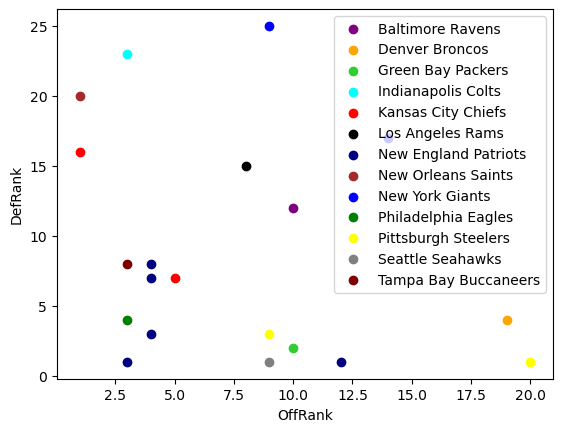

In [32]:
import matplotlib.pyplot as plt

#Create scatter color coded scatter plot

# Set up the plot
fig, ax = plt.subplots()

# Define colors for the winners
colors = {'New England Patriots': 'navy', 
          'Philadelphia Eagles': 'green',
          'Indianapolis Colts': 'aqua',
          'New York Giants': 'blue',
          'New Orleans Saints': 'brown',
          'Green Bay Packers': 'limegreen',
          'Baltimore Ravens': 'purple',
          'Seattle Seahawks': 'grey',
          'Denver Broncos': 'orange',
          'Kansas City Chiefs': 'red',
          'Tampa Bay Buccaneers': 'maroon',
          'Los Angeles Rams': 'black',
          'Pittsburgh Steelers': 'yellow'
         
         }

# Create the scatter plot
for winner, group in new_3filtered.groupby('Winner'):
    ax.scatter(group['OffRank'], group['DefRank'], c=colors[winner], label=winner)

# Add labels and legend
ax.set_xlabel('OffRank')
ax.set_ylabel('DefRank')
ax.legend()
plt.savefig(f"output_data/offense_vs_defense_scatter.png")
plt.show()

# Scatter Plot Summary:

    1. Looking into the scatter plot above:
        - There have been 9 teams that have won the Superbowl while being ranked as a Top 5 Offense
        - There have also been 9 teams that have won the Superbowl while being ranked as a Top 5 Defense
        - Only 3 teams have won the Superbowl while being ranked as both a Top 5 Offense and Top 5 Defense
        
  Since results are fairly even, went to the Top 10 mark instead of Top 5
  
      2. Looking into the scatter plot above:
        - There have been 15 teams that have won the Superbowl while being ranked as a Top 10 Offense
        - There have also been 13 teams that have won the Superbowl while being ranked as a Top 10 Defense
        - There are 15 teams have won the Superbowl while being ranked as both a Top 10 Offense and Top 10 Defense
        
   Conclusion:
       
       3. Based on the scatter plot , regardless of offensive rank, teams with the better defense may have a slightly higher chance of winning the Super Bowl.


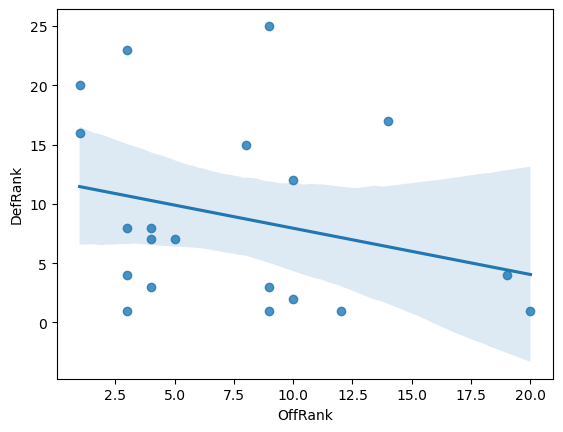

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

#Create liner regression to see how DefRank relates to OffRank

# Set up the plot
fig, ax = plt.subplots()

# Create the scatter plot with regression line
sns.regplot(data=new_3filtered, x='OffRank', y='DefRank', ax=ax)

# Add labels
ax.set_xlabel('OffRank')
ax.set_ylabel('DefRank')
plt.savefig(f"output_data/offense_vs_defense_linear_regression.png")
plt.show()

# Linear Regression

Based on the linear regression above, as defense gets better (a higher ranking), offense has a tendency to get weaker.  This may be due to the fact that as more defensive stats are gained, it is a lessor chance to increase on offensive stats.  In essence this could it be caused by an increase of playing time which forces the offense to have less playing time....which would equate to lessor stat totals.

In [34]:
import statsmodels.api as sm

X = new_3filtered[['OffRank', 'DefRank']]
y = new_3filtered['Season']
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
predictions = model.predict(X)

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 Season   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     1.152
Date:                Wed, 15 Feb 2023   Prob (F-statistic):              0.339
Time:                        14:26:09   Log-Likelihood:                -62.148
No. Observations:                  20   AIC:                             130.3
Df Residuals:                      17   BIC:                             133.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2015.6982      3.097    650.864      0.0

# Linear Regression through statsmodels 

The Dependent Variable is “Season”, with 20 Observations.

R-squared  measures how much the offensive and defensive rankings are explained by changes in the season. 0.119 means this Linear Regression model only explains 11.9% of the change throughout the seasons in this model. The R-squared value can increase with additional variables, so this model may look more accurate with multiple variables even if they are poorly contributing.

The Adjusted R-squared adjusts for predictors that are not significant. The low Adjusted R-squared of 0.016 may indicate that some variables are not contributing well to this model’s R-squared value.

<b>Conclusion:</b> A limited sample size of 20 observations makes it difficult to accurately identify offensive and defensive rankings trends.

In [35]:
#Create Statistical Correlation Analysis to see if offensive rankings have any correlation to Deffensive Rankings.

correlation_matrix = new_3filtered[['OffRank', 'DefRank']].corr()
print(correlation_matrix)

          OffRank   DefRank
OffRank  1.000000 -0.274733
DefRank -0.274733  1.000000


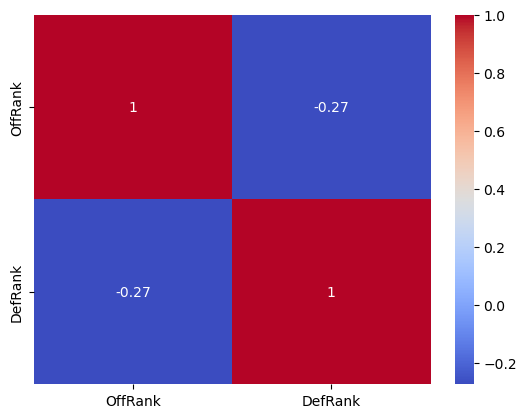

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.savefig(f"output_data/offense_vs_defense_heat_map.png")
plt.show()

# Statistical Correlation Analysis


The Statistical Correlation Heatmap analysis above is to prove out a NON correlation between Offensive and Deffensive rankings.
TThe negative number shows a non-correlation to the two fields. Offensive Rankings and Defensive Rankings, when compared to each other, appear to be a Non-Correlation.

<b>Conclusion:</b> Shows a NON correlation between Offensive and Defensive rankings. Rankings are based on offensive and defensive stats, however, those stats can be skewed by a number of factors such as playing time, coaching decisions, etc. Because of these factors, teams can be ranked for a number of reasons and because of those reasons we therefore have an incomplete picture of any actual correlation.

In [37]:
# Drop extra columns
playoff_max_round_df = playoff_max_round_df.drop(columns="OffRank")
playoff_max_round_df = playoff_max_round_df.drop(columns="DefRank")

In [38]:
# Set variables for charts
offense_color = "blue"
defense_color = "green"
line_eq_color = "red"
r_value_color = "purple"
marker_size = 300
title_font_size = 14
axis_font_size = 12

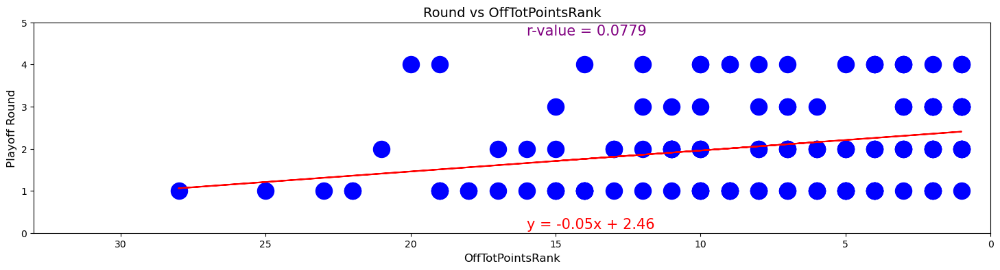

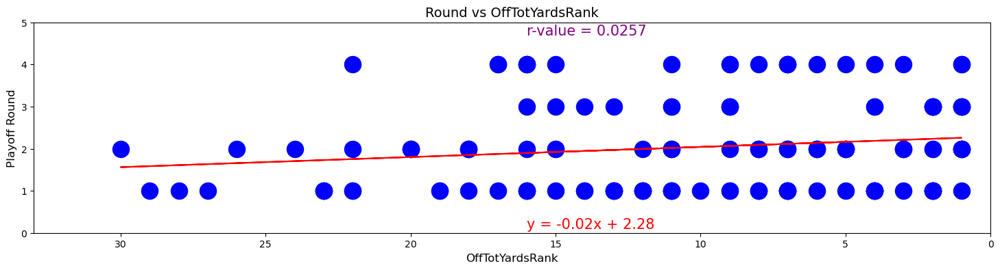

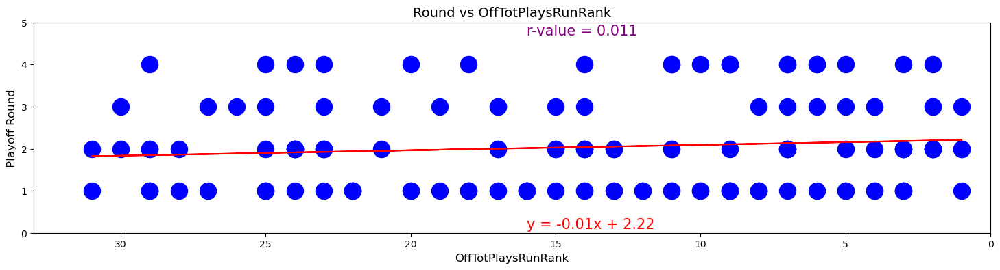

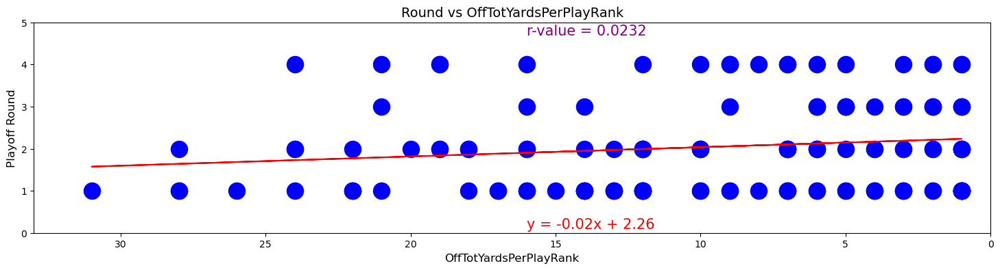

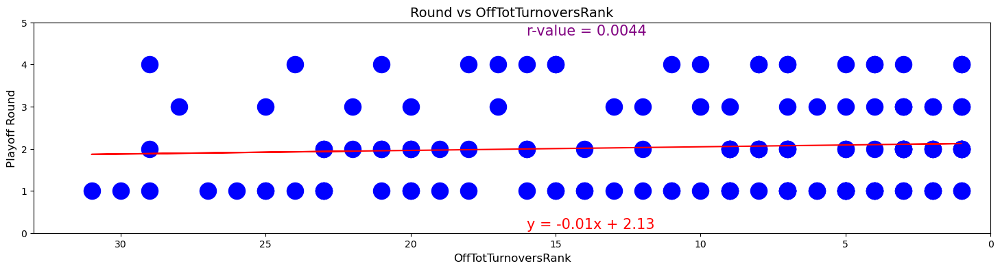

...

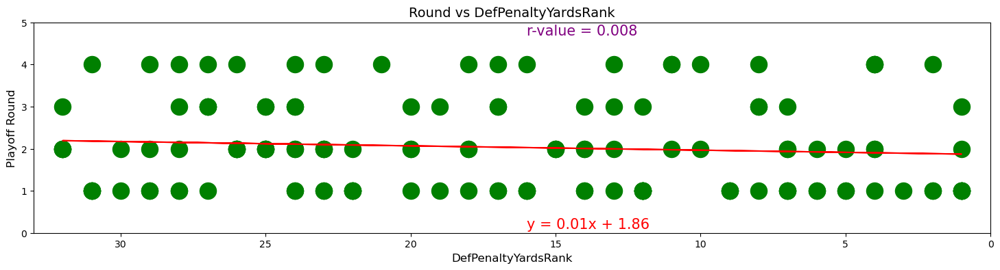

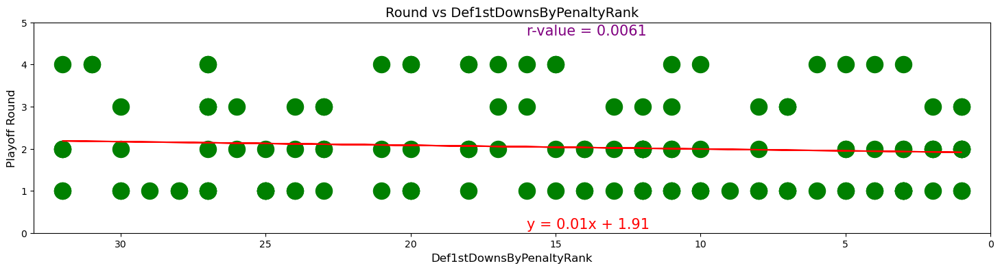

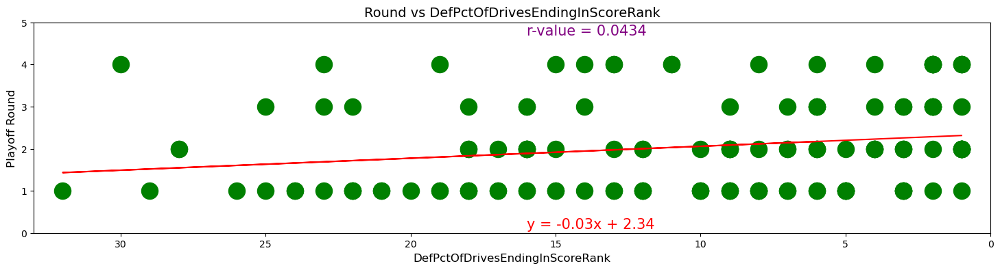

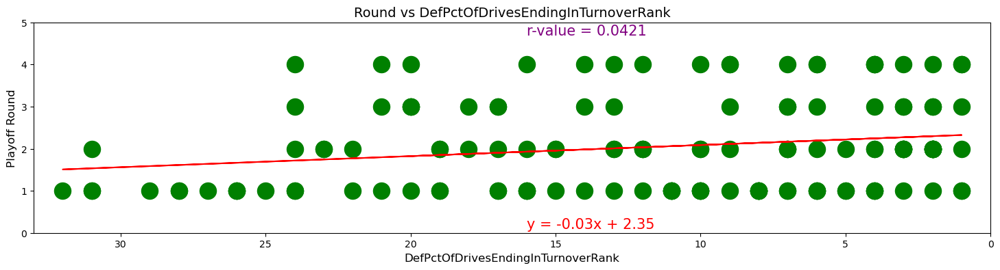

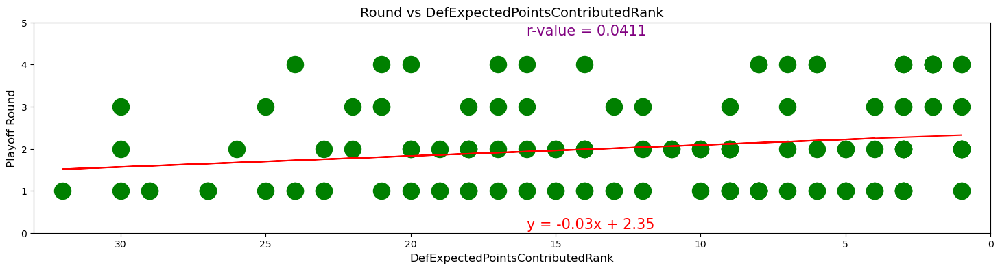

In [39]:
#BASIC SCATTER PLOTS for all 50 categories

#Loop through all of the columns
for col in playoff_max_round_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Only use 'Rank' versions for the scatter plots
    if (col.startswith("Off") | col.startswith("Def")) & col.endswith("Rank"):
        if col.startswith("Off"):
            clr=offense_color
        else:
            clr=defense_color
        plt.figure(figsize=(18, 4))
        plt.xlim(0, 33)
        plt.ylim(0, 5)
        x_values = playoff_max_round_df[col]
        y_values = playoff_max_round_df["MaxRound"]
        (slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
        regress_values = x_values * slope + intercept
        line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
        plt.scatter(
            x_values,
            y_values,
            c=clr,
            marker='o',
            s=marker_size,
            alpha=1
        )
        # Reverse x-axis so best ranking (i.e. lowest) is to the right
        plt.gca().invert_xaxis()
        # Incorporate the other graph properties
        plt.xlabel(col, fontsize=axis_font_size)
        plt.ylabel('Playoff Round', fontsize=axis_font_size)
        plt.title(f"Round vs {col}", fontsize=title_font_size)
        plt.plot(x_values,regress_values,"r-")
        plt.annotate(line_eq,(16,0.1),fontsize=15,color=line_eq_color)
        plt.annotate(f"r-value = {round(rvalue**2,4)}",(16,4.7),fontsize=15,color=r_value_color)
        # Save the figure
        plt.savefig(f"output_data/begin_{col}.png")
        # Show plot
        plt.show()

# Basic Scatter Plot

## Every playoff team's regular season rank, and the highest round they advanced to

All 50 statistical categories were analyzed individually in the above scatter plots.

There are 4 playoff rounds (1-4).

Higher rounds equate to a team has winning more playoff games.

Round 4 is the Super Bowl Winner.

Lower numbers along the x-axis (moving towards the right) indicate the better rankings (1 is best).

<b>Issue with a basic scatter plot:</b> Overplotting (multiple plots on the same value).


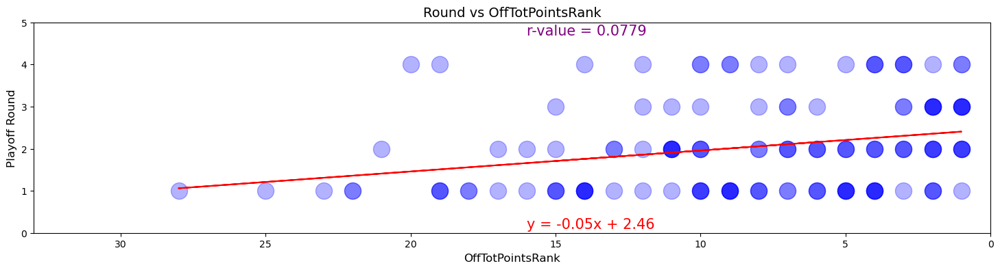

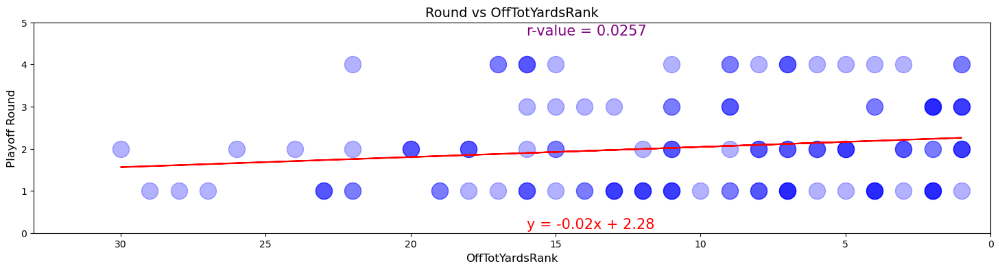

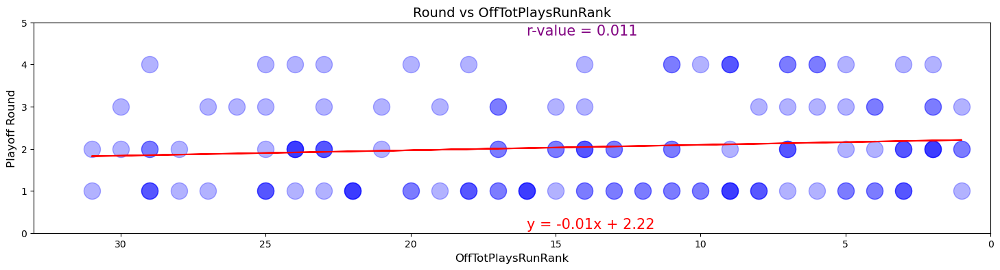

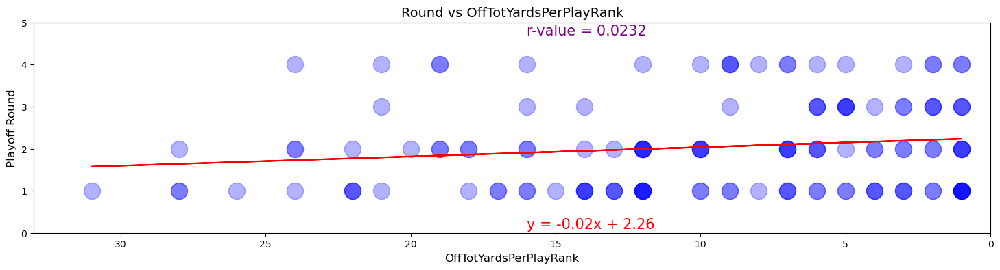

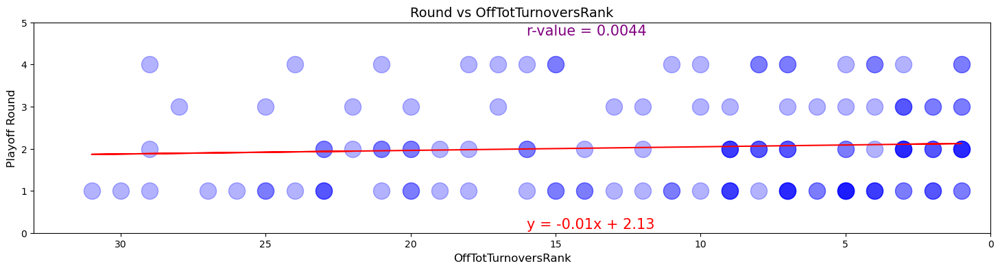

...

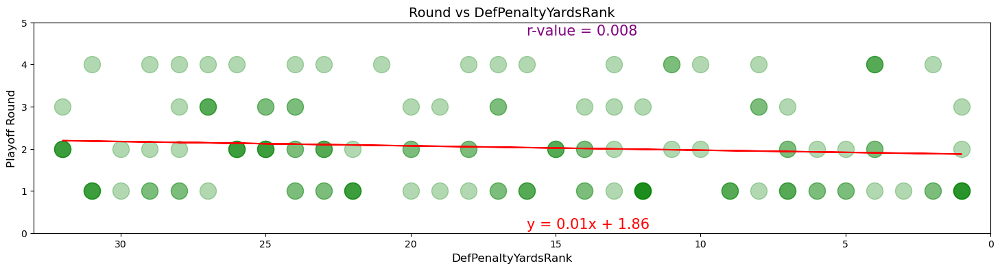

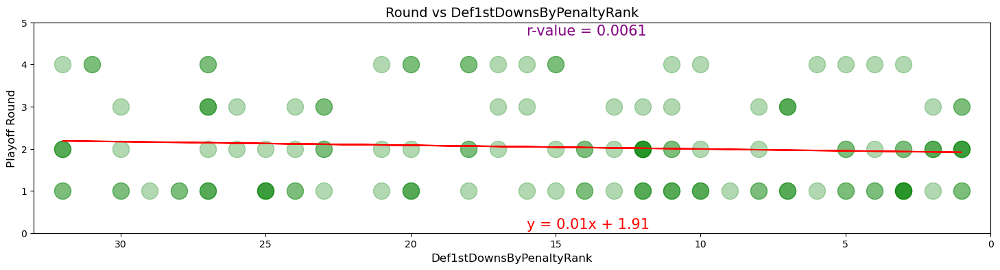

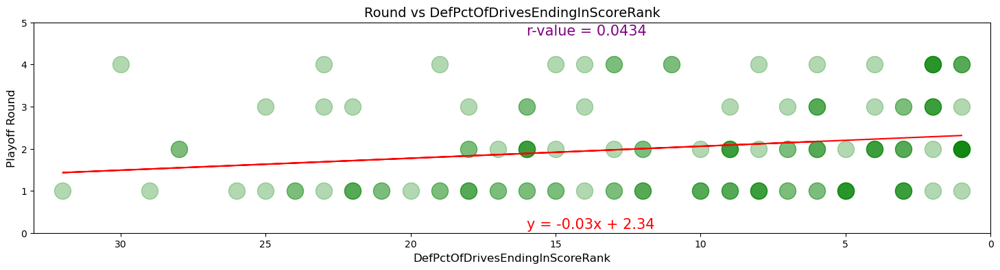

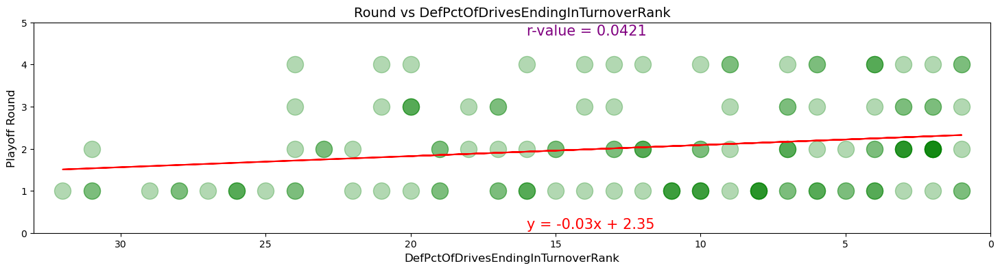

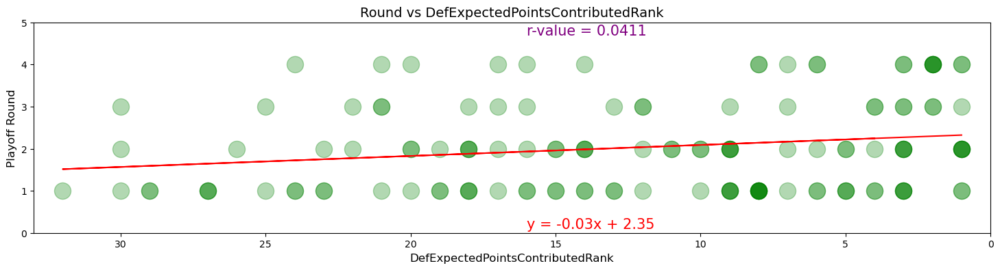

In [40]:
#SCATTER PLOTS WITH TRANSPARENCY for all 50 categories

#Loop through all of the columns
for col in playoff_max_round_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Only use 'Rank' versions for the scatter plots
    if (col.startswith("Off") | col.startswith("Def")) & col.endswith("Rank"):
        if col.startswith("Off"):
            clr=offense_color
        else:
            clr=defense_color
        plt.figure(figsize=(18, 4))
        plt.xlim(0, 33)
        plt.ylim(0, 5)
        x_values = playoff_max_round_df[col]
        y_values = playoff_max_round_df["MaxRound"]
        (slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
        regress_values = x_values * slope + intercept
        line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

        plt.scatter(
            x_values,
            y_values,
            c=clr,
            marker='o',
            s=marker_size,
            alpha=.3
        )
        # Reverse x-axis so best ranking (i.e. lowest) is to the right
        plt.gca().invert_xaxis()
        # Incorporate the other graph properties
        plt.xlabel(col, fontsize=axis_font_size)
        plt.ylabel('Playoff Round', fontsize=axis_font_size)
        plt.title(f"Round vs {col}", fontsize=title_font_size)
        plt.plot(x_values,regress_values,"r-")
        plt.annotate(line_eq,(16,0.1),fontsize=15,color=line_eq_color)
        plt.annotate(f"r-value = {round(rvalue**2,4)}",(16,4.7),fontsize=15,color=r_value_color)
        # Save the figure
        plt.savefig(f"output_data/scatter_{col}.png")    
        # Show plot
        plt.show()

# Scatter Plot with Transparency

## Every playoff team's regular season rank, and the highest round they advanced to

The above scatter plots add transparency, so overplotted points appear darker.

<b>Issue:</b> It is still not clear enough to determine the true extent of overplotting.

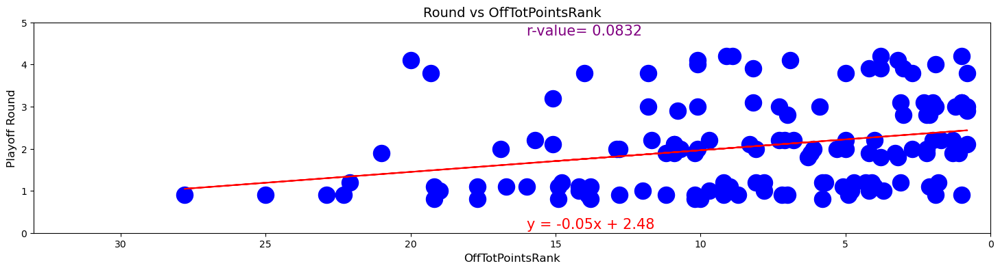

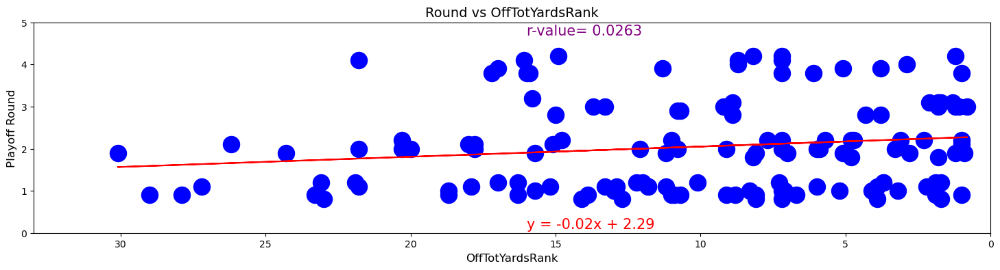

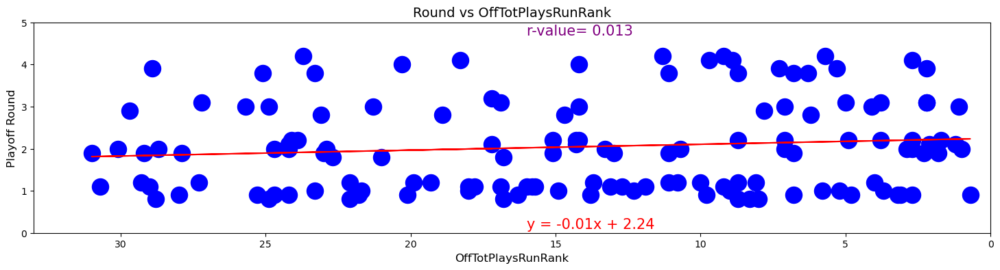

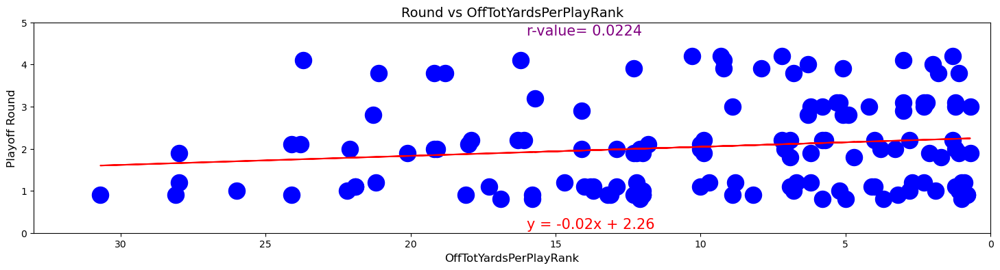

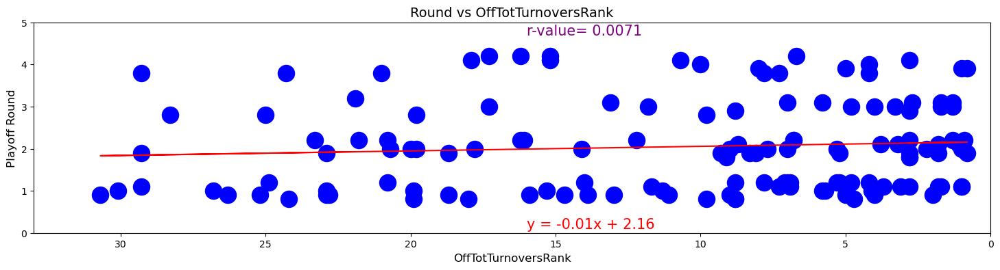

...

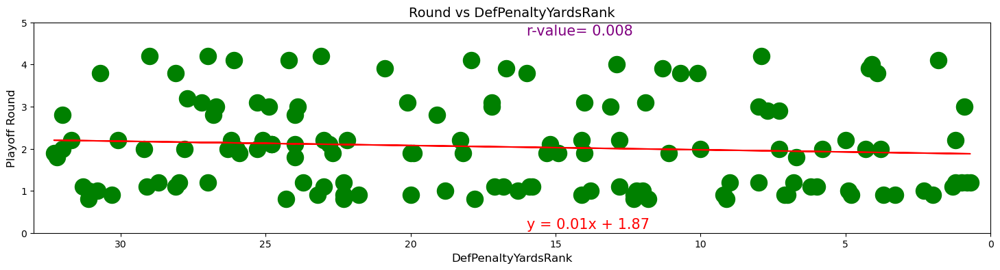

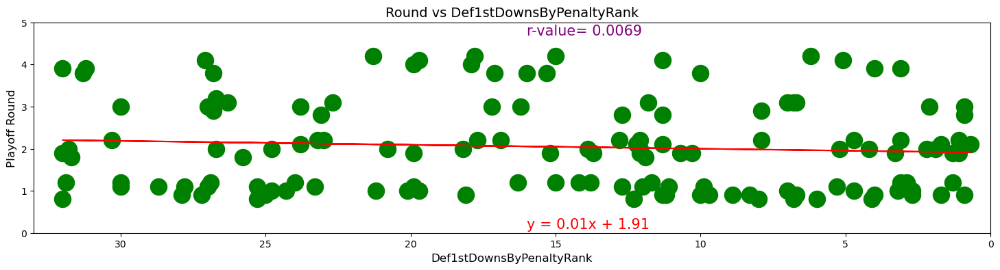

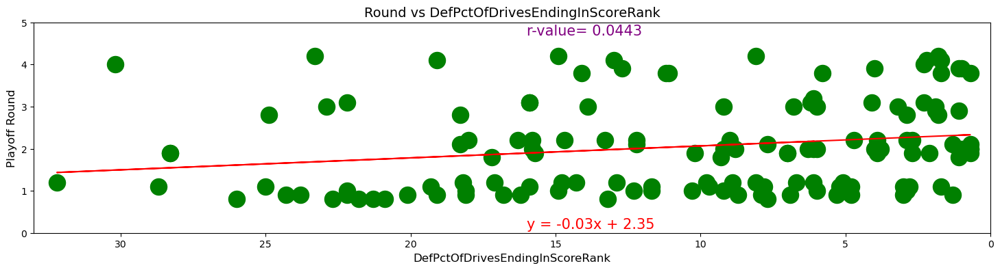

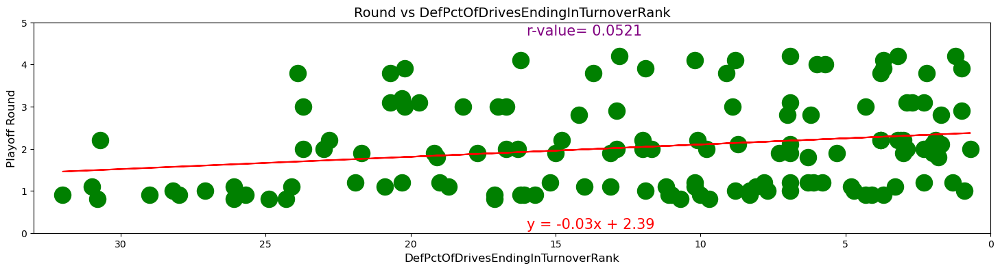

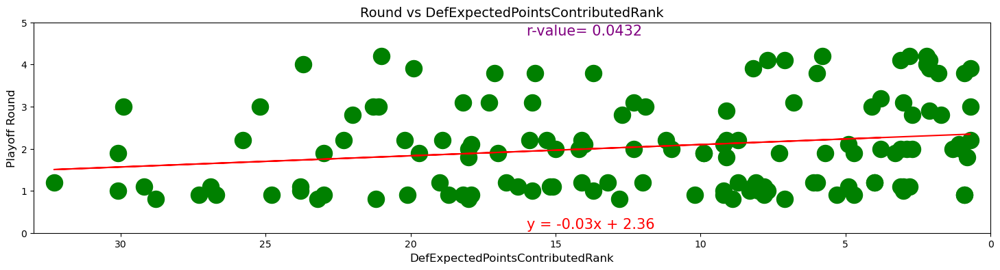

In [41]:
#JITTER PLOTS for all 50 categories (values slightly changed randomly to reduce overplotting)

playoff_max_round_altered_df = playoff_max_round_df.copy()
playoff_max_round_altered_df
for index, row in playoff_max_round_altered_df.iterrows():
    decimal = (random.randint(-2,2))/10
    row["MaxRound"]=row["MaxRound"]+decimal
    playoff_max_round_altered_df.at[index, "MaxRound"]=row["MaxRound"]

#Loop through all of the columns
for col in playoff_max_round_altered_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Only use 'Rank' versions for the scatter plots
    if (col.startswith("Off") | col.startswith("Def")) & col.endswith("Rank"):
        #Randomly change values from between -0.3 to 0.3 to reduce overplotting
        for index, row in playoff_max_round_altered_df.iterrows():
            decimal = (random.randint(-3,3))/10
            row[col]=row[col]+decimal
            playoff_max_round_altered_df.at[index, col]=row[col]
        if col.startswith("Off"):
            clr=offense_color
        else:
            clr=defense_color
        plt.figure(figsize=(18, 4))
        plt.xlim(0, 33)
        plt.ylim(0, 5)
        x_values = playoff_max_round_altered_df[col]
        y_values = playoff_max_round_altered_df["MaxRound"]
        (slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
        regress_values = x_values * slope + intercept
        line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

        plt.scatter(
            x_values,
            y_values,
            c=clr,
            marker='o',
            s=marker_size,
            alpha=1
        )
        # Reverse x-axis so best rankings (i.e. lowest) are to the right
        plt.gca().invert_xaxis()
        # Incorporate the other graph properties
        plt.xlabel(col, fontsize=axis_font_size)
        plt.ylabel('Playoff Round', fontsize=axis_font_size)
        plt.title(f"Round vs {col}", fontsize=title_font_size)
        plt.plot(x_values,regress_values,"r-")
        plt.annotate(line_eq,(16,0.1),fontsize=15,color=line_eq_color)
        plt.annotate(f"r-value= {round(rvalue**2,4)}",(16,4.7),fontsize=15,color=r_value_color)
        # Save the figure
        plt.savefig(f"output_data/jitter_{col}.png")
        # Show plot
        plt.show()

# Jitter Plots

## Every playoff team's regular season rank, and the highest round they advanced to

The above jitter plots randomly adjust the plot values within a range of -0.3 to 0.3 units. 

<b>Issue:</b> Overplotting improves, but the plot values are no longer completely accurate.

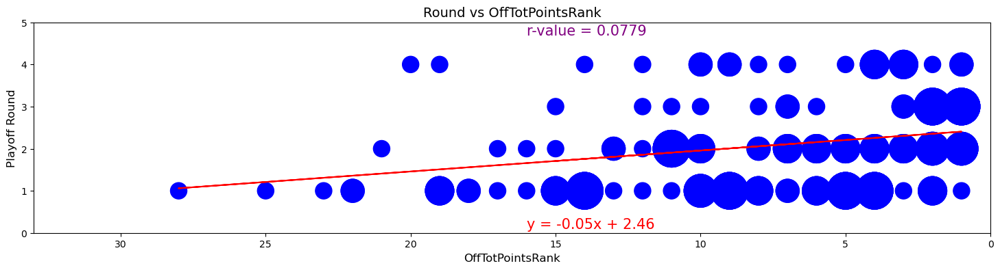

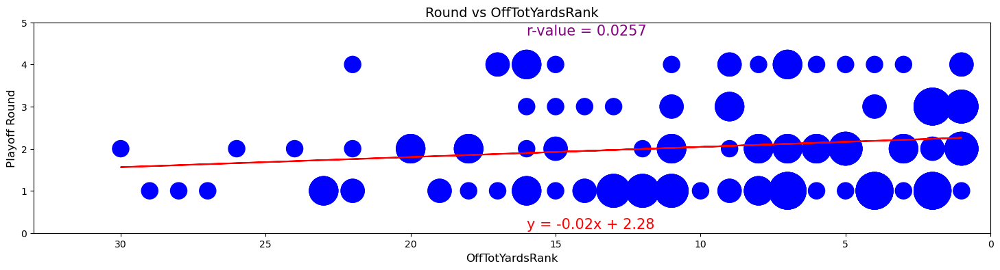

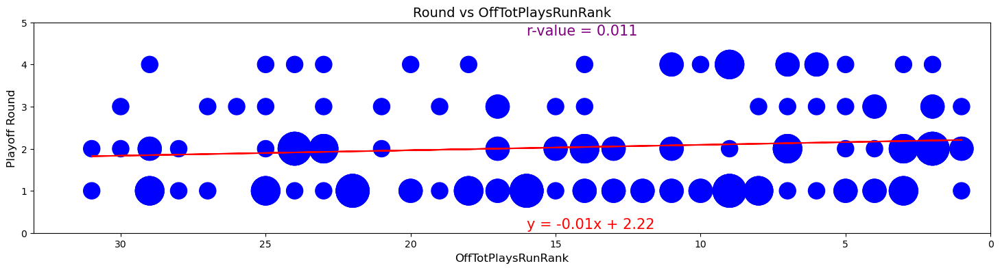

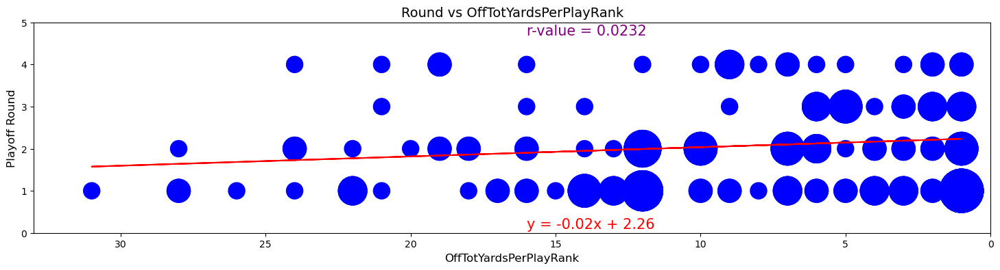

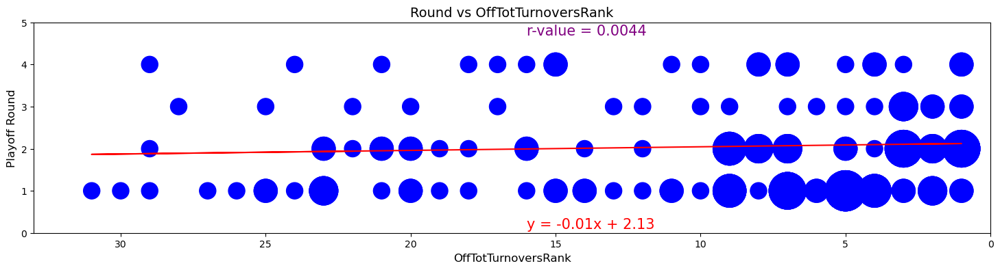

...

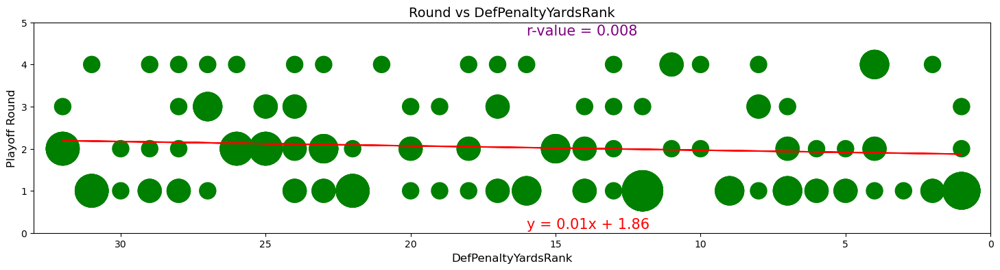

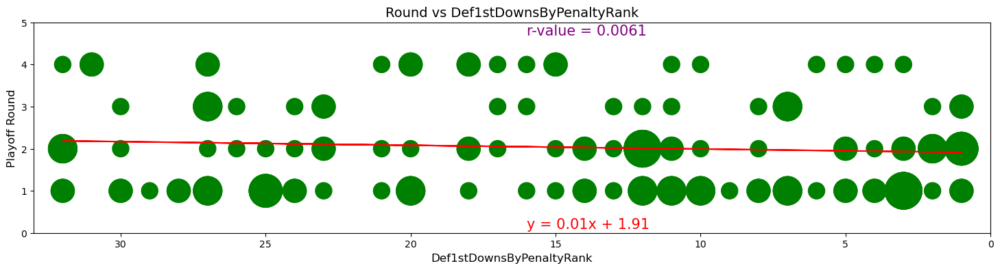

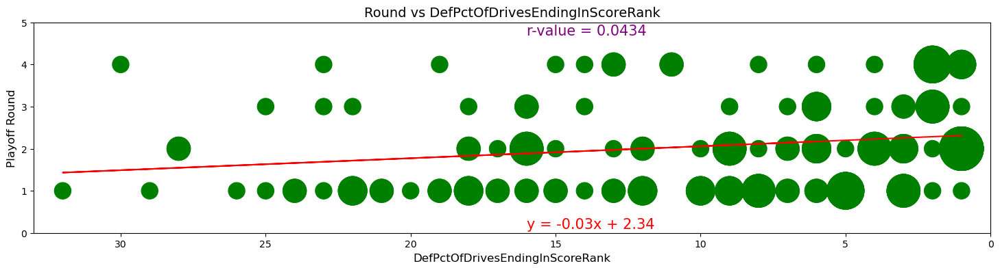

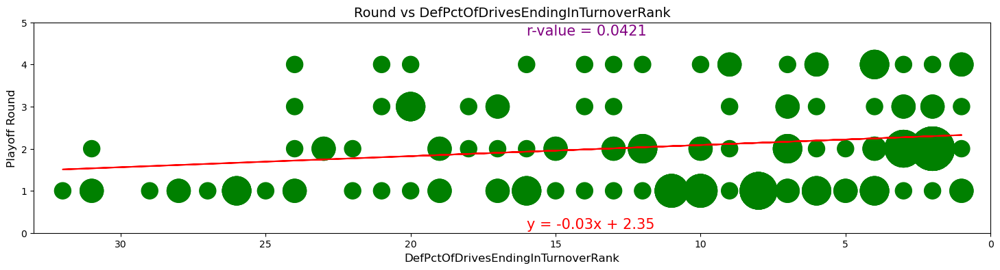

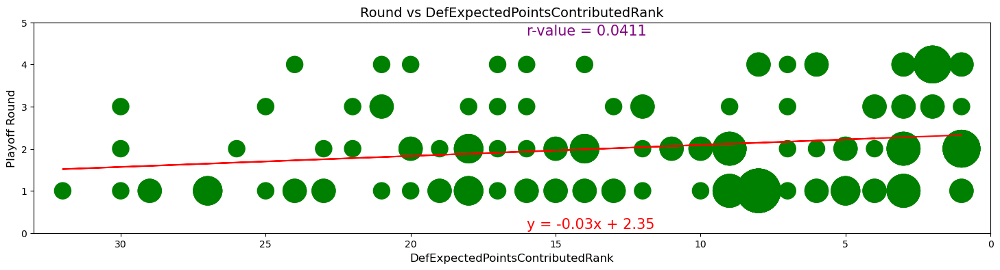

In [42]:
#BUBBLE PLOTS for all 50 categories (larger plots = more plots in same location)

#Loop through all of the columns
for col in playoff_max_round_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Only use 'Rank' versions for the scatter plots
    if (col.startswith("Off") | col.startswith("Def")) & col.endswith("Rank"):
        for index, row in playoff_max_round_df.iterrows():
            if row[col] <= 9:
                stat="0"+str(row[col])
            else:
                stat=str(row[col])
            selection=str(row["MaxRound"])+stat
            playoff_max_round_df.at[index, "Selection"]=selection
        for index, row in playoff_max_round_df.iterrows():
            playoff_max_round_df.at[index, "SelectionCount"] = \
            300*(playoff_max_round_df["Selection"][playoff_max_round_df["Selection"]\
                                                   == row["Selection"]].count())
        if col.startswith("Off"):
            clr=offense_color
        else:
            clr=defense_color
        plt.figure(figsize=(18, 4))
        plt.xlim(0, 33)
        plt.ylim(0, 5)
        x_values = playoff_max_round_df[col]
        y_values = playoff_max_round_df["MaxRound"]
        (slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
        regress_values = x_values * slope + intercept
        line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

        plt.scatter(
            x_values,
            y_values,
            c=clr,
            marker='o',
            s=playoff_max_round_df["SelectionCount"],
            alpha=1
        )
        # Reverse x-axis so best ranking (i.e. lowest) is to the right
        plt.gca().invert_xaxis()
        # Incorporate the other graph properties
        plt.xlabel(col, fontsize=axis_font_size)
        plt.ylabel('Playoff Round', fontsize=axis_font_size)
        plt.title(f"Round vs {col}", fontsize=title_font_size)
        plt.plot(x_values,regress_values,"r-")
        plt.annotate(line_eq,(16,0.1),fontsize=15,color=line_eq_color)
        plt.annotate(f"r-value = {round(rvalue**2,4)}",(16,4.7),fontsize=15,color=r_value_color)
        
        playoff_max_round_df.to_csv("output_data/playoff_max_round_df.csv", index=False)
        
        
#         Save the figure
        plt.savefig(f"output_data/bubble_{col}.png")
#         Show plot
        plt.show()

# Bubble Plots

## Every playoff team's regular season rank, and the highest round they advanced to

In the above bubble plots, <b>larger points indicate higher values</b>, which prevents overplotting issues while preserving data integrity.

This is accomplished by counting instances of duplicate plot values and adjusting the marker size proportionately.

<b>Issue:</b> Overplotting improves, but the plot values are no longer completely accurate.

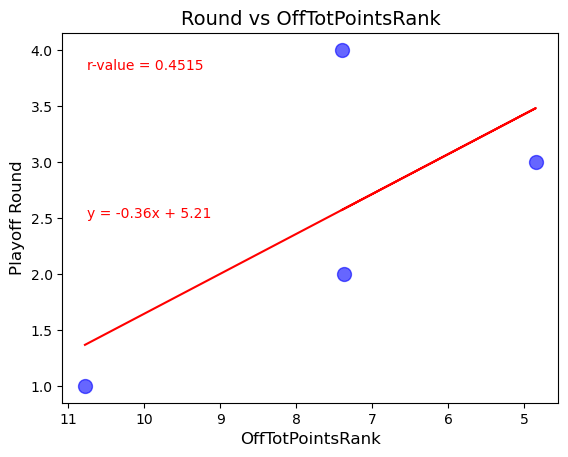

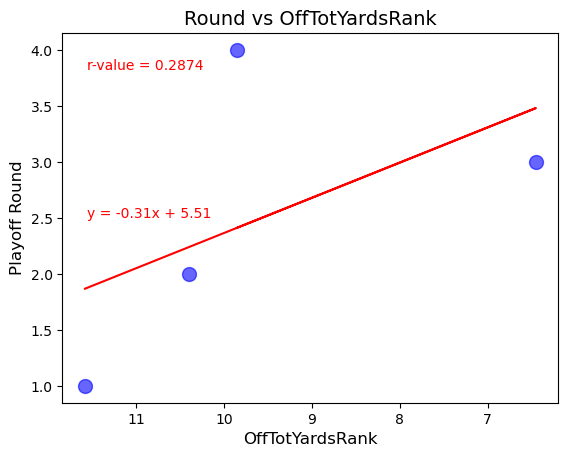

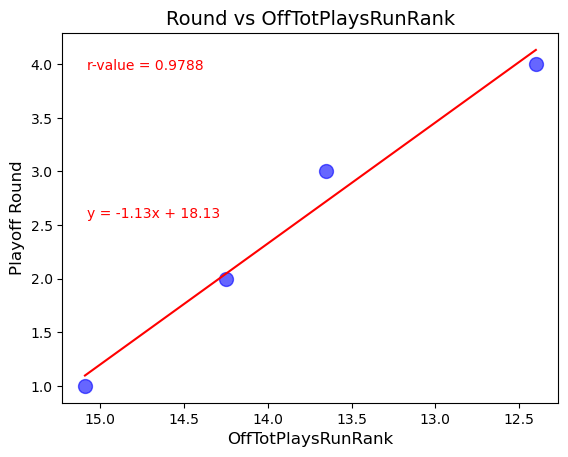

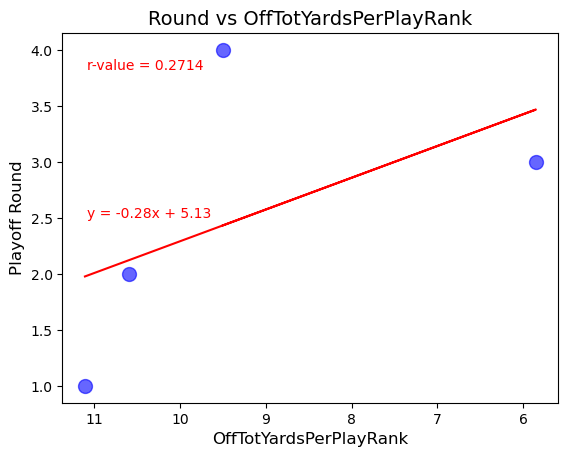

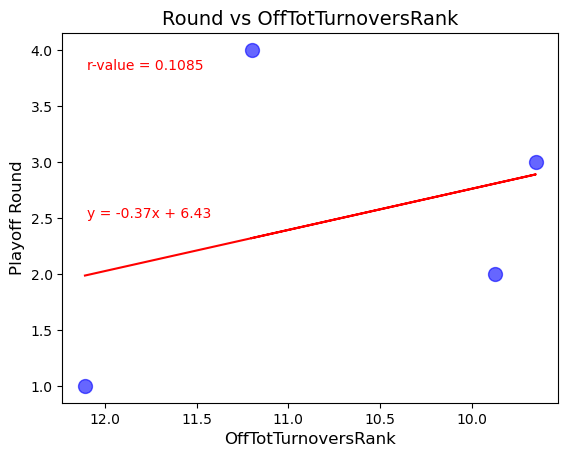

...

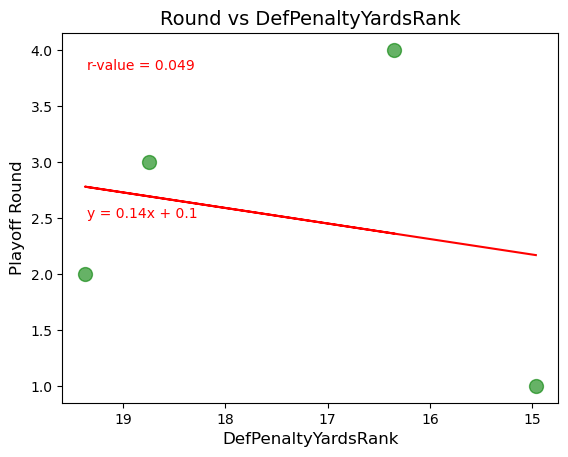

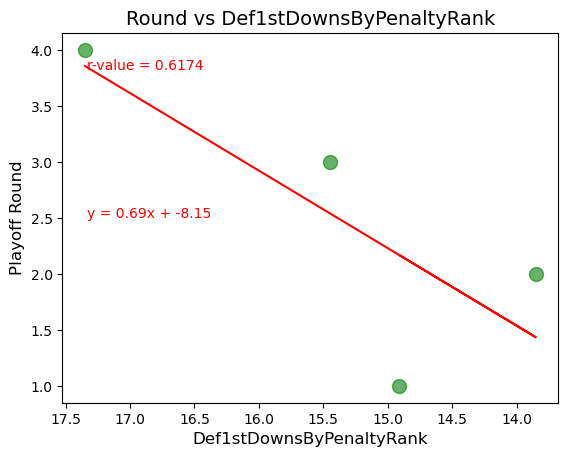

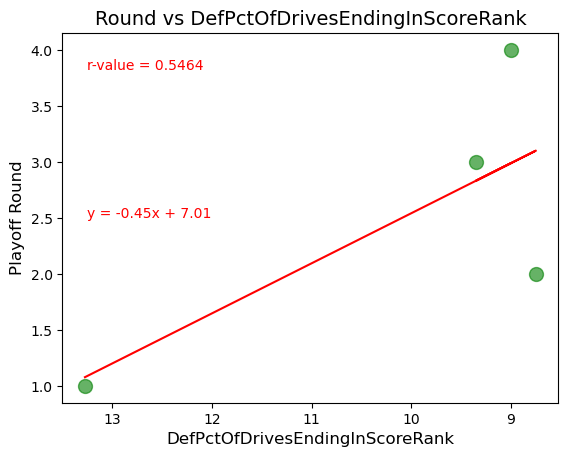

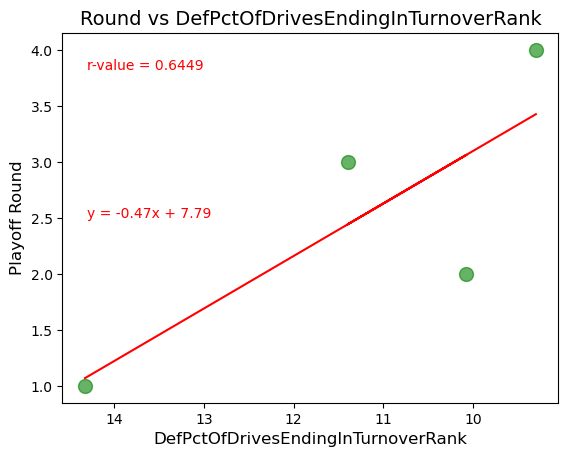

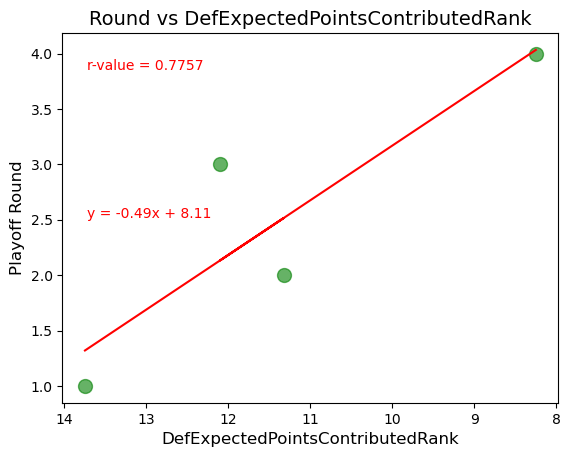

In [43]:
# SCATTER PLOTS OF AVERAGE VALUES BY ROUND< FOR EACH CATEGORY
playoff_averages_by_round_df = playoff_max_round_df.groupby("MaxRound").mean().reset_index()

# New r_values dataframe for the combined average for each playoff round.
# Each row is appended individually as the scatterplots are drawn.
r_values_df = pd.DataFrame( {'type': [''], 'r_value': [0]} )

#Loop through all of the columns
for col in playoff_averages_by_round_df.columns:
    # Only look at 'Offense' and 'Defense' stats (ignore first few unrelated cols)
    # Only use 'Rank' versions for the scatter plots
    if (col.startswith("Off") | col.startswith("Def")) & col.endswith("Rank"):
        if col.startswith("Off"):
            clr=offense_color
        else:
            clr=defense_color
        x_values = playoff_averages_by_round_df[col]
        y_values = playoff_averages_by_round_df["MaxRound"]
        (slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
        regress_values = x_values * slope + intercept
        line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

        plt.scatter(
            x_values,
            y_values,
            c=clr,
            marker='o',
            s=100,
            alpha=.6
        )
        # Reverse x-axis so best ranking (i.e. lowest) is to the right
        plt.gca().invert_xaxis()
        # Incorporate the other graph properties
        plt.xlabel(col, fontsize=axis_font_size)
        plt.ylabel('Playoff Round', fontsize=axis_font_size)
        plt.title(f"Round vs {col}", fontsize=title_font_size)
        plt.plot(x_values,regress_values,"r-")
        plt.text(0.05, 0.5, line_eq, color=line_eq_color, transform=plt.gca().transAxes)
        plt.text(0.05, 0.9, f"r-value = {round(rvalue**2,4)}", color=line_eq_color, transform=plt.gca().transAxes)
        plt.savefig(f"output_data/average_{col}.png")
        
        # Adding new rows to the r_values dataframe
        r_values_df.loc[-1] = [col, round(rvalue**2,4)]  # adding a row
        r_values_df.index = r_values_df.index + 1  # shifting index
        r_values_df = r_values_df.sort_index()  # sorting by index

        # Show plot
        plt.show()

# Additional Bubble Plots and R-Value Analysis
## Grouped by the Round Number, and averaging that round’s rankings across all years
Grouping by the round number, and using the average rankings of all years and all teams in each round, the r-values of a few categories produced some extremely high correlations.

The highest correlation is Defensive Passing Net Yards Per Attempt

Of the 50 statistical categories, this is one of the most obscure

The r-value is an extremely strong .9988

Average Rank in this category:
8.2 – Round 4 (Super Bowl Winner)
10.0 – Round 3
11.5 – Round 2
13.3 – Round 1

In [44]:
# Show the r_value dataframe that was built while looping through the scatter plots above
r_values_df = r_values_df.sort_values(by=['r_value'], ascending=False)  
r_values_df

,type,r_value
12,DefPassNetYardsPerAttemptRank,0.9988
47,OffTotPlaysRunRank,0.9788
41,OffPassAttemptsRank,0.9623
21,DefTotYardsPerPlayRank,0.9568
13,DefPassInterceptionsRank,0.8828
39,OffPassTouchdownsRank,0.8343
40,OffPassYardsRank,0.7871
0,DefExpectedPointsContributedRank,0.7757
42,OffPassCompletionsRank,0.7372
32,OffRushYardsPerAttemptRank,0.6638


In [45]:
# Top correlations
r_values_best_df = r_values_df[r_values_df['r_value'] > .8]          
r_values_best_df = r_values_best_df.sort_values(by=['r_value'], ascending=False)                        
r_values_best_df

,type,r_value
12,DefPassNetYardsPerAttemptRank,0.9988
47,OffTotPlaysRunRank,0.9788
41,OffPassAttemptsRank,0.9623
21,DefTotYardsPerPlayRank,0.9568
13,DefPassInterceptionsRank,0.8828
39,OffPassTouchdownsRank,0.8343


In [46]:
# Values for the top corrolated category
playoff_averages_by_round_df[["MaxRound", "DefPassNetYardsPerAttemptRank"]]

,MaxRound,DefPassNetYardsPerAttemptRank
0,1,13.254545
1,2,11.525000
2,3,10.000000
3,4,8.150000


In [47]:
DefPassNetYardsPerAttemptRank_df = playoff_max_round_df[["Season", "MaxRound", "DefPassNetYardsPerAttemptRank"]]
DefPassNetYardsPerAttemptRank_df = DefPassNetYardsPerAttemptRank_df.sort_values(by=['Season', 'MaxRound'])
DefPassNetYardsPerAttemptRank_df.tail(30)

,Season,MaxRound,DefPassNetYardsPerAttemptRank
103,2018,3,21
104,2018,4,10
108,2019,1,25
110,2019,1,7
112,2019,1,23
107,2019,2,16
113,2019,2,19
111,2019,3,1
109,2019,4,5
114,2020,1,4


The plot points in the above Additional Bubble Plots are average values of all playoff teams, across all years. Teams with higher rankings in this area tend to go further in the playoffs.

When viewing DefPassNetYardsPerAttemptRank along with it's bubble plot, and then reviewing it's ranking by year in the above dataset, it becomes more clear that this average value is not likely to be an accurate indicator of a Super Bowl win.

More analysis is needed to determine how accurate of an identifier this is, possibly predicting which teams have better than average chances of success.